In [24]:
import requests
import dash
import numpy as np
import pandas as pd
from datetime import datetime
file_location = '/Users/Vijayraje.Jadhav/Desktop/venv/TxGearUtil-main'

In [25]:
df = pd.read_csv('/Users/Vijayraje.Jadhav/Downloads/Transmission_alerts_all_vehicles.csv')

df

,Unnamed: 0,status,code,severity,vehicle_id,account_id,vehicle_plate,timestamp,description,manufacturer,fault_code.manufacturer,spec.fuel_type
0,0,active,54-7,1,1322630116085334016,1254200041346695168,851729,2024-12-23T19:06:04.000Z,Transmission Synchronizer Brake Value,freightliner_trucks,NaN,petrol
1,1,removed,54-7,1,1322630116085334016,1254200041346695168,851729,2024-12-23T19:26:40.000Z,Transmission Synchronizer Brake Value,freightliner_trucks,NaN,petrol
2,2,active,54-7,1,1322630116085334016,1254200041346695168,851729,2024-12-20T21:31:35.000Z,Transmission Synchronizer Brake Value,freightliner_trucks,NaN,petrol
3,3,removed,54-7,1,1322630116085334016,1254200041346695168,851729,2024-12-20T21:42:01.000Z,Transmission Synchronizer Brake Value,freightliner_trucks,NaN,petrol
4,4,active,54-7,1,1322630116085334016,1254200041346695168,851729,2024-12-26T20:37:39.000Z,Transmission Synchronizer Brake Value,freightliner_trucks,NaN,petrol
...,...,...,...,...,...,...,...,...,...,...,...,...
4585,31,removed,191-2,2,1258946650567606272,1254200041346695168,52440,2025-08-13T02:53:05.000Z,Transmission 1 Output Shaft Speed,tico,NaN,petrol
4586,0,active,36-7,1,1258946650567606272,1254200041346695168,52440,2024-06-14T10:55:11.000Z,Clutch plates,tico,NaN,petrol
4587,1,removed,36-7,1,1258946650567606272,1254200041346695168,52440,2024-06-14T11:07:20.000Z,Clutch plates,tico,NaN,petrol
4588,2,active,36-7,1,1258946650567606272,1254200041346695168,52440,2025-05-24T23:50:59.000Z,Clutch plates,tico,NaN,petrol


In [26]:
cdf = df[df['description'].str.contains('Transmission Shift ', case=False)]
cdf

,Unnamed: 0,status,code,severity,vehicle_id,account_id,vehicle_plate,timestamp,description,manufacturer,fault_code.manufacturer,spec.fuel_type
36,0,logged,3187-12,1,1322629166524268544,1254200041346695168,247109,2025-01-21T21:56:06.000Z,Transmission Shift Console Data Link,freightliner_trucks,NaN,diesel
37,1,removed,3187-12,1,1322629166524268544,1254200041346695168,247109,2025-01-22T01:02:46.000Z,Transmission Shift Console Data Link,freightliner_trucks,NaN,diesel
38,2,logged,3187-12,1,1322629166524268544,1254200041346695168,247109,2025-01-22T01:13:05.000Z,Transmission Shift Console Data Link,freightliner_trucks,NaN,diesel
39,3,removed,3187-12,1,1322629166524268544,1254200041346695168,247109,2025-01-22T01:21:36.000Z,Transmission Shift Console Data Link,freightliner_trucks,NaN,diesel
170,0,active,6146-17,2,1254200628196933632,1254200041346695168,249583,2024-03-13T06:01:50.000Z,Transmission Shift Rail 3,kenworth,NaN,diesel
171,1,removed,6146-17,2,1254200628196933632,1254200041346695168,249583,2024-03-13T06:10:05.000Z,Transmission Shift Rail 3,kenworth,NaN,diesel
172,2,active,6147-17,1,1254200628196933632,1254200041346695168,249583,2024-05-23T01:52:20.000Z,Transmission Shift Rail 4,kenworth,NaN,diesel
173,3,removed,6147-17,1,1254200628196933632,1254200041346695168,249583,2024-05-23T02:02:30.000Z,Transmission Shift Rail 4,kenworth,NaN,diesel
174,4,active,6146-17,2,1254200628196933632,1254200041346695168,249583,2024-07-27T07:45:18.000Z,Transmission Shift Rail 3,kenworth,NaN,diesel
175,5,removed,6146-17,2,1254200628196933632,1254200041346695168,249583,2024-07-27T08:09:28.000Z,Transmission Shift Rail 3,kenworth,NaN,diesel


In [27]:
cdf.shape

(46, 12)

In [28]:
cdf['timestamp_ms'] = pd.to_datetime(cdf['timestamp']).astype('int64') // 10**6

cdf

/var/folders/by/txnj5f656kg46yy6d1xy7c7w0000gp/T/ipykernel_5914/155816374.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cdf['timestamp_ms'] = pd.to_datetime(cdf['timestamp']).astype('int64') // 10**6


,Unnamed: 0,status,code,severity,vehicle_id,account_id,vehicle_plate,timestamp,description,manufacturer,fault_code.manufacturer,spec.fuel_type,timestamp_ms
36,0,logged,3187-12,1,1322629166524268544,1254200041346695168,247109,2025-01-21T21:56:06.000Z,Transmission Shift Console Data Link,freightliner_trucks,NaN,diesel,1737496566000
37,1,removed,3187-12,1,1322629166524268544,1254200041346695168,247109,2025-01-22T01:02:46.000Z,Transmission Shift Console Data Link,freightliner_trucks,NaN,diesel,1737507766000
38,2,logged,3187-12,1,1322629166524268544,1254200041346695168,247109,2025-01-22T01:13:05.000Z,Transmission Shift Console Data Link,freightliner_trucks,NaN,diesel,1737508385000
39,3,removed,3187-12,1,1322629166524268544,1254200041346695168,247109,2025-01-22T01:21:36.000Z,Transmission Shift Console Data Link,freightliner_trucks,NaN,diesel,1737508896000
170,0,active,6146-17,2,1254200628196933632,1254200041346695168,249583,2024-03-13T06:01:50.000Z,Transmission Shift Rail 3,kenworth,NaN,diesel,1710309710000
171,1,removed,6146-17,2,1254200628196933632,1254200041346695168,249583,2024-03-13T06:10:05.000Z,Transmission Shift Rail 3,kenworth,NaN,diesel,1710310205000
172,2,active,6147-17,1,1254200628196933632,1254200041346695168,249583,2024-05-23T01:52:20.000Z,Transmission Shift Rail 4,kenworth,NaN,diesel,1716429140000
173,3,removed,6147-17,1,1254200628196933632,1254200041346695168,249583,2024-05-23T02:02:30.000Z,Transmission Shift Rail 4,kenworth,NaN,diesel,1716429750000
174,4,active,6146-17,2,1254200628196933632,1254200041346695168,249583,2024-07-27T07:45:18.000Z,Transmission Shift Rail 3,kenworth,NaN,diesel,1722066318000
175,5,removed,6146-17,2,1254200628196933632,1254200041346695168,249583,2024-07-27T08:09:28.000Z,Transmission Shift Rail 3,kenworth,NaN,diesel,1722067768000


In [29]:
cdf.reset_index(drop=True, inplace=True)


In [30]:
three_days_ms = 3 * 24 * 60 * 60 * 1000
cdf['three_days_before_ms'] = cdf['timestamp_ms'] - three_days_ms
cdf

/var/folders/by/txnj5f656kg46yy6d1xy7c7w0000gp/T/ipykernel_5914/3698108687.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cdf['three_days_before_ms'] = cdf['timestamp_ms'] - three_days_ms


,Unnamed: 0,status,code,severity,vehicle_id,account_id,vehicle_plate,timestamp,description,manufacturer,fault_code.manufacturer,spec.fuel_type,timestamp_ms,three_days_before_ms
0,0,logged,3187-12,1,1322629166524268544,1254200041346695168,247109,2025-01-21T21:56:06.000Z,Transmission Shift Console Data Link,freightliner_trucks,NaN,diesel,1737496566000,1737237366000
1,1,removed,3187-12,1,1322629166524268544,1254200041346695168,247109,2025-01-22T01:02:46.000Z,Transmission Shift Console Data Link,freightliner_trucks,NaN,diesel,1737507766000,1737248566000
2,2,logged,3187-12,1,1322629166524268544,1254200041346695168,247109,2025-01-22T01:13:05.000Z,Transmission Shift Console Data Link,freightliner_trucks,NaN,diesel,1737508385000,1737249185000
3,3,removed,3187-12,1,1322629166524268544,1254200041346695168,247109,2025-01-22T01:21:36.000Z,Transmission Shift Console Data Link,freightliner_trucks,NaN,diesel,1737508896000,1737249696000
4,0,active,6146-17,2,1254200628196933632,1254200041346695168,249583,2024-03-13T06:01:50.000Z,Transmission Shift Rail 3,kenworth,NaN,diesel,1710309710000,1710050510000
5,1,removed,6146-17,2,1254200628196933632,1254200041346695168,249583,2024-03-13T06:10:05.000Z,Transmission Shift Rail 3,kenworth,NaN,diesel,1710310205000,1710051005000
6,2,active,6147-17,1,1254200628196933632,1254200041346695168,249583,2024-05-23T01:52:20.000Z,Transmission Shift Rail 4,kenworth,NaN,diesel,1716429140000,1716169940000
7,3,removed,6147-17,1,1254200628196933632,1254200041346695168,249583,2024-05-23T02:02:30.000Z,Transmission Shift Rail 4,kenworth,NaN,diesel,1716429750000,1716170550000
8,4,active,6146-17,2,1254200628196933632,1254200041346695168,249583,2024-07-27T07:45:18.000Z,Transmission Shift Rail 3,kenworth,NaN,diesel,1722066318000,1721807118000
9,5,removed,6146-17,2,1254200628196933632,1254200041346695168,249583,2024-07-27T08:09:28.000Z,Transmission Shift Rail 3,kenworth,NaN,diesel,1722067768000,1721808568000


In [31]:
one_day_after = 1 * 24 * 60 * 60 * 1000
cdf['one_day_after_ms'] = cdf['timestamp_ms'] + one_day_after
cdf

/var/folders/by/txnj5f656kg46yy6d1xy7c7w0000gp/T/ipykernel_5914/1893092919.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cdf['one_day_after_ms'] = cdf['timestamp_ms'] + one_day_after


,Unnamed: 0,status,code,severity,vehicle_id,account_id,vehicle_plate,timestamp,description,manufacturer,fault_code.manufacturer,spec.fuel_type,timestamp_ms,three_days_before_ms,one_day_after_ms
0,0,logged,3187-12,1,1322629166524268544,1254200041346695168,247109,2025-01-21T21:56:06.000Z,Transmission Shift Console Data Link,freightliner_trucks,NaN,diesel,1737496566000,1737237366000,1737582966000
1,1,removed,3187-12,1,1322629166524268544,1254200041346695168,247109,2025-01-22T01:02:46.000Z,Transmission Shift Console Data Link,freightliner_trucks,NaN,diesel,1737507766000,1737248566000,1737594166000
2,2,logged,3187-12,1,1322629166524268544,1254200041346695168,247109,2025-01-22T01:13:05.000Z,Transmission Shift Console Data Link,freightliner_trucks,NaN,diesel,1737508385000,1737249185000,1737594785000
3,3,removed,3187-12,1,1322629166524268544,1254200041346695168,247109,2025-01-22T01:21:36.000Z,Transmission Shift Console Data Link,freightliner_trucks,NaN,diesel,1737508896000,1737249696000,1737595296000
4,0,active,6146-17,2,1254200628196933632,1254200041346695168,249583,2024-03-13T06:01:50.000Z,Transmission Shift Rail 3,kenworth,NaN,diesel,1710309710000,1710050510000,1710396110000
5,1,removed,6146-17,2,1254200628196933632,1254200041346695168,249583,2024-03-13T06:10:05.000Z,Transmission Shift Rail 3,kenworth,NaN,diesel,1710310205000,1710051005000,1710396605000
6,2,active,6147-17,1,1254200628196933632,1254200041346695168,249583,2024-05-23T01:52:20.000Z,Transmission Shift Rail 4,kenworth,NaN,diesel,1716429140000,1716169940000,1716515540000
7,3,removed,6147-17,1,1254200628196933632,1254200041346695168,249583,2024-05-23T02:02:30.000Z,Transmission Shift Rail 4,kenworth,NaN,diesel,1716429750000,1716170550000,1716516150000
8,4,active,6146-17,2,1254200628196933632,1254200041346695168,249583,2024-07-27T07:45:18.000Z,Transmission Shift Rail 3,kenworth,NaN,diesel,1722066318000,1721807118000,1722152718000
9,5,removed,6146-17,2,1254200628196933632,1254200041346695168,249583,2024-07-27T08:09:28.000Z,Transmission Shift Rail 3,kenworth,NaN,diesel,1722067768000,1721808568000,1722154168000


In [32]:
# function to extract the required PIDs from the string LABELS
def extract_PID_data(data, protocol, LABEL):
    if protocol == 'SAE_AVG':
        if LABEL == 'ENGINE_RPM':
            PID_TAG = 'spn_190_avg'
        elif LABEL == 'FRP':
            PID_TAG = 'spn_157_avg' # 245
        elif LABEL == 'OIL_PRESSURE':
            PID_TAG = 'spn_100_avg'
        elif LABEL == 'OIL_TEMPERATURE':
            PID_TAG = 'spn_175_avg'
        elif LABEL ==  'FUEL_RATE':
            PID_TAG = 'spn_183_avg'
        elif LABEL == 'THROTTLE':
             PID_TAG = 'spn_51_avg'
    elif protocol == 'SAE':
        if LABEL ==   'ENGINE_RPM':
            PID_TAG = '190'
        elif LABEL == 'FRP':
            PID_TAG = '157'
        elif LABEL == 'OIL_PRESSURE':
            PID_TAG = '100'
        elif LABEL == 'OIL_TEMPERATURE':
            PID_TAG = '175'
        elif LABEL == 'DEF_DOSING_RATE':
            PID_TAG = '4331'
        elif LABEL ==  'FUEL_RATE':
            PID_TAG = '183'
        elif LABEL == 'ENGINE_HOUR':
            PID_TAG = '247'
        elif LABEL == 'THROTTLE':
             PID_TAG = '51'
        elif LABEL == 'GEAR_UTILIZATION':
             PID_TAG = '523'
        elif LABEL == 'WHEEL_SPEED':
             PID_TAG = '84'
        elif LABEL == 'LOAD':
             PID_TAG = '92'
        elif LABEL == 'ACCELERATION_PEDAL':
             PID_TAG = '91'

    elif protocol == 'ISO':
        if LABEL ==   'ENGINE_RPM':
            PID_TAG = '0C'
        elif LABEL == 'ACCELERATION_PEDAL':
             PID_TAG = '49'
        elif LABEL == 'LOAD':
             PID_TAG = '04'
        elif LABEL == 'GEAR_UTILIZATION':
             PID_TAG = '164'
        elif LABEL == 'WHEEL_SPEED':
             PID_TAG = '0D'

    Time_vec = []
    Val_vec = []
    for data_cnt in range(0,len(data)):
        if "pids" in data[data_cnt]:
            if len(data[data_cnt]['pids'])>0:
                for sub_pid_cnt in range(0,len(data[data_cnt]['pids'])):  #this loop
                    State = data[data_cnt]['pids'][sub_pid_cnt]
                    if PID_TAG in State:
                        #print("--------------------------------------------IN----------------------------------")
                        Time_vec.append(State[PID_TAG]['timestamp'])
                        Val_vec.append(State[PID_TAG]['value'][0])
    return Time_vec, Val_vec 

In [33]:
grouped = cdf.groupby('vehicle_id')
grouped

group_sizes = grouped.size()
print(group_sizes)


vehicle_id
1254200564464484352    10
1254200628196933632    28
1263931224401903616     2
1264017215108153344     2
1322629166524268544     4
dtype: int64


In [34]:
cdf.vehicle_id.unique()

array([1322629166524268544, 1254200628196933632, 1264017215108153344,
       1263931224401903616, 1254200564464484352])

In [35]:
cdf.code.value_counts()

code
6146-17    18
6147-17    10
3187-12     4
6147-15     4
5910-14     2
6145-18     2
6145-15     2
6145-1      2
6145-0      2
Name: count, dtype: int64

In [179]:
cdf[(cdf.vehicle_id== 1254200628196933632)]

,Unnamed: 0,status,code,severity,vehicle_id,account_id,vehicle_plate,timestamp,description,manufacturer,fault_code.manufacturer,spec.fuel_type,timestamp_ms,three_days_before_ms,one_day_after_ms
4,0,active,6146-17,2,1254200628196933632,1254200041346695168,249583,2024-03-13T06:01:50.000Z,Transmission Shift Rail 3,kenworth,NaN,diesel,1710309710000,1710050510000,1710396110000
5,1,removed,6146-17,2,1254200628196933632,1254200041346695168,249583,2024-03-13T06:10:05.000Z,Transmission Shift Rail 3,kenworth,NaN,diesel,1710310205000,1710051005000,1710396605000
6,2,active,6147-17,1,1254200628196933632,1254200041346695168,249583,2024-05-23T01:52:20.000Z,Transmission Shift Rail 4,kenworth,NaN,diesel,1716429140000,1716169940000,1716515540000
7,3,removed,6147-17,1,1254200628196933632,1254200041346695168,249583,2024-05-23T02:02:30.000Z,Transmission Shift Rail 4,kenworth,NaN,diesel,1716429750000,1716170550000,1716516150000
8,4,active,6146-17,2,1254200628196933632,1254200041346695168,249583,2024-07-27T07:45:18.000Z,Transmission Shift Rail 3,kenworth,NaN,diesel,1722066318000,1721807118000,1722152718000
9,5,removed,6146-17,2,1254200628196933632,1254200041346695168,249583,2024-07-27T08:09:28.000Z,Transmission Shift Rail 3,kenworth,NaN,diesel,1722067768000,1721808568000,1722154168000
10,6,active,6146-17,2,1254200628196933632,1254200041346695168,249583,2024-06-14T03:32:31.000Z,Transmission Shift Rail 3,kenworth,NaN,diesel,1718335951000,1718076751000,1718422351000
11,7,removed,6146-17,2,1254200628196933632,1254200041346695168,249583,2024-06-14T03:39:07.000Z,Transmission Shift Rail 3,kenworth,NaN,diesel,1718336347000,1718077147000,1718422747000
12,8,active,6146-17,2,1254200628196933632,1254200041346695168,249583,2024-07-23T08:36:20.000Z,Transmission Shift Rail 3,kenworth,NaN,diesel,1721723780000,1721464580000,1721810180000
13,9,removed,6146-17,2,1254200628196933632,1254200041346695168,249583,2024-07-23T08:51:15.000Z,Transmission Shift Rail 3,kenworth,NaN,diesel,1721724675000,1721465475000,1721811075000


In [182]:
vehicle_id = '1254200628196933632'
Start_TS = 1749544000000
End_TS =  1751100866000
country_FLAG = 'US'
if country_FLAG == 'US':
    OBD_data_path = 'https://old-data-downloader.intangles-aws-us-east-1.intangles.us/download/' + str(vehicle_id) +  "/" + str(Start_TS) + "/" + str(End_TS)
    PROTOCOL = 'SAE'
elif country_FLAG == 'IN':
    OBD_data_path = 'http://data-download.intangles.com:1883/download/' + str(vehicle_id) +  "/" + str(Start_TS) + "/" + str(End_TS) 
    PROTOCOL = 'SAE'
elif country_FLAG == 'FML':
    OBD_data_path = "http://algo-internal-apis.intangles-fml-aws-ap-south-1.fml.intangles.in/download/" + str(vehicle_id) +  "/" + str(Start_TS) + "/" + str(End_TS)
r = requests.get(OBD_data_path, stream=True)
data = r.json()   

ChunkedEncodingError: ('Connection broken: IncompleteRead(8905258 bytes read, 232358094 more expected)', IncompleteRead(8905258 bytes read, 232358094 more expected))

In [ ]:
data

[{'_id': '1322629166524268544:1737465115000:1737465208000:92412',
  'tracker_id': '1202618572417794062',
  'vehicle_id': '1322629166524268544',
  'account_id': '1254200041346695168',
  'refid': 'fef08bea-4330-4de3-bb75-618749658087',
  'server_timestamp': 1737465211676.0,
  'protocol': 'SAE J1939',
  'start_time': 1737465115000.0,
  'end_time': 1737465208000.0,
  'pt': '92412',
  'pids': [{'spn_84_avg': {'timestamp': 1737465115000.0, 'value': [0]},
    'spn_91_avg': {'timestamp': 1737465115000.0, 'value': [0]},
    'spn_92_avg': {'timestamp': 1737465115000.0, 'value': [0]},
    'spn_190_avg': {'timestamp': 1737465115000.0, 'value': [0]},
    'dff_84_avg': {'timestamp': 1737465115000.0, 'value': [0]},
    'dff_91_avg': {'timestamp': 1737465115000.0, 'value': [0]},
    'dff_92_avg': {'timestamp': 1737465115000.0, 'value': [0]},
    'dff_190_avg': {'timestamp': 1737465115000.0, 'value': [0]},
    'spn_3250_avg': {'timestamp': 1737465115000.0, 'value': [-9.34375]},
    'spn_3251_avg': {'ti

In [ ]:
PROTOCOL = 'SAE'
LABEL = 'ENGINE_RPM'
RPM_Time_vec,RPM_Val_vec = extract_PID_data(data, PROTOCOL,LABEL)
print(RPM_Time_vec)
print(RPM_Val_vec)

[1737465123000.0, 1737465131250.0, 1737465139500.0, 1737465147750.0, 1737465156000.0, 1737465164250.0, 1737465172500.0, 1737465180750.0, 1737465189000.0, 1737465197250.0, 1737465205500.0, 1737465213750.0, 1737465217000.0, 1737465226000.0, 1737465234167.0, 1737465242334.0, 1737465250501.0, 1737465258668.0, 1737465266835.0, 1737465275002.0, 1737465283169.0, 1737465291336.0, 1737465299503.0, 1737465307670.0, 1737465315837.0, 1737465319000.0, 1737465327000.0, 1737465335250.0, 1737465343500.0, 1737465351750.0, 1737465360000.0, 1737465368250.0, 1737465376500.0, 1737465384750.0, 1737465393000.0, 1737465401250.0, 1737465409500.0, 1737465417750.0, 1737465421000.0, 1737465430000.0, 1737465438250.0, 1737465446500.0, 1737465454750.0, 1737465463000.0, 1737465471250.0, 1737465479500.0, 1737465487750.0, 1737465496000.0, 1737465504250.0, 1737465512500.0, 1737465520750.0, 1737465524000.0, 1737465533000.0, 1737465541167.0, 1737465549334.0, 1737465557501.0, 1737465565668.0, 1737465573835.0, 1737465582002

In [ ]:
PROTOCOL = 'SAE'
LABEL = 'GEAR_UTILIZATION'
GEAR_RATIO_Time_vec,GEAR_RATIO_Val_vec = extract_PID_data(data, PROTOCOL,LABEL)
print(GEAR_RATIO_Time_vec)
print(GEAR_RATIO_Val_vec)

[1737465147750.0, 1737465197250.0, 1737465250501.0, 1737465299503.0, 1737465351750.0, 1737465401250.0, 1737465454750.0, 1737465504250.0, 1737465557501.0, 1737465606503.0, 1737465659501.0, 1737465708503.0, 1737465760999.0, 1737465810997.0, 1737465876500.0, 1737465921750.0, 1737465971250.0, 1737466024750.0, 1737466074250.0, 1737466126501.0, 1737466228999.0, 1737466278997.0, 1737466544503.0, 1737466596750.0, 1737466646250.0, 1737466699501.0, 1737466748503.0, 1737466801501.0, 1737466850503.0, 1737466903501.0, 1737466952503.0, 1737467005501.0, 1737467054503.0, 1737467157997.0, 1737467211251.0, 1737467261753.0, 1737468269250.0, 1737468370750.0, 1737468420250.0, 1737468484625.0, 1737492176750.0, 1737492226250.0, 1737492279500.0, 1737492330500.0, 1737497780999.0, 1737501564997.0, 1737501618999.0, 1737501668997.0, 1737501722999.0, 1737501772997.0, 1737501827251.0, 1737501877753.0, 1737501930999.0, 1737501980997.0, 1737502034999.0, 1737502084997.0, 1737502138999.0, 1737502188997.0, 1737502242999

In [ ]:
PROTOCOL = 'SAE'
LABEL = 'WHEEL_SPEED'
WHEEL_SPEED_Time_vec,WHEEL_SPEED_Val_vec = extract_PID_data(data, PROTOCOL,LABEL)
print(WHEEL_SPEED_Time_vec)
print(WHEEL_SPEED_Val_vec)

[1737465172500.0, 1737465275002.0, 1737465376500.0, 1737465479500.0, 1737466049500.0, 1737466253998.0, 1737466621500.0, 1737466724002.0, 1737466826002.0, 1737467451998.0, 1737492421002.0, 1737494530502.0, 1737495259998.0, 1737495671500.0, 1737496083500.0, 1737496396502.0, 1737496509502.0, 1737496625998.0, 1737496741998.0, 1737496858502.0, 1737496967998.0, 1737497377002.0, 1737498137998.0, 1737498241002.0, 1737498343002.0, 1737498547002.0, 1737499057002.0, 1737499159002.0, 1737499261500.0, 1737499363002.0, 1737499876998.0, 1737499981502.0, 1737500500998.0, 1737500811998.0, 1737500915998.0, 1737501020502.0, 1737501227998.0, 1737501435998.0, 1737501643998.0, 1737501747998.0, 1737502683998.0, 1737502995998.0, 1737503099998.0, 1737503203998.0, 1737503517998.0, 1737503725500.0, 1737503828998.0, 1737503932500.0, 1737504138500.0, 1737504964500.0, 1737505067500.0, 1737505170500.0, 1737505273500.0, 1737505376500.0, 1737505495400.0, 1737507406998.0, 1737508232500.0, 1737508845998.0, 1737508949998

In [ ]:
PROTOCOL = 'SAE'
LABEL = 'LOAD'
LOAD_Time_vec,LOAD_Val_vec = extract_PID_data(data, PROTOCOL,LABEL)
print(LOAD_Time_vec)
print(LOAD_Val_vec)

[1737465123000.0, 1737465131250.0, 1737465139500.0, 1737465147750.0, 1737465156000.0, 1737465164250.0, 1737465172500.0, 1737465180750.0, 1737465189000.0, 1737465197250.0, 1737465205500.0, 1737465213750.0, 1737465226000.0, 1737465234167.0, 1737465242334.0, 1737465250501.0, 1737465258668.0, 1737465266835.0, 1737465275002.0, 1737465283169.0, 1737465291336.0, 1737465299503.0, 1737465307670.0, 1737465315837.0, 1737465327000.0, 1737465335250.0, 1737465343500.0, 1737465351750.0, 1737465360000.0, 1737465368250.0, 1737465376500.0, 1737465384750.0, 1737465393000.0, 1737465401250.0, 1737465409500.0, 1737465417750.0, 1737465430000.0, 1737465438250.0, 1737465446500.0, 1737465454750.0, 1737465463000.0, 1737465471250.0, 1737465479500.0, 1737465487750.0, 1737465496000.0, 1737465504250.0, 1737465512500.0, 1737465520750.0, 1737465533000.0, 1737465541167.0, 1737465549334.0, 1737465557501.0, 1737465565668.0, 1737465573835.0, 1737465582002.0, 1737465590169.0, 1737465598336.0, 1737465606503.0, 1737465614670

In [ ]:
PROTOCOL = 'SAE'
LABEL = 'ACCELERATION_PEDAL'
ACCELERATION_PEDAL_Time_vec,ACCELERATION_PEDAL_Val_vec = extract_PID_data(data, PROTOCOL,LABEL)
print(ACCELERATION_PEDAL_Time_vec)
print(ACCELERATION_PEDAL_Val_vec)

[1737465123000.0, 1737465131250.0, 1737465139500.0, 1737465147750.0, 1737465156000.0, 1737465164250.0, 1737465172500.0, 1737465180750.0, 1737465189000.0, 1737465197250.0, 1737465205500.0, 1737465213750.0, 1737465226000.0, 1737465234167.0, 1737465242334.0, 1737465250501.0, 1737465258668.0, 1737465266835.0, 1737465275002.0, 1737465283169.0, 1737465291336.0, 1737465299503.0, 1737465307670.0, 1737465315837.0, 1737465327000.0, 1737465335250.0, 1737465343500.0, 1737465351750.0, 1737465360000.0, 1737465368250.0, 1737465376500.0, 1737465384750.0, 1737465393000.0, 1737465401250.0, 1737465409500.0, 1737465417750.0, 1737465430000.0, 1737465438250.0, 1737465446500.0, 1737465454750.0, 1737465463000.0, 1737465471250.0, 1737465479500.0, 1737465487750.0, 1737465496000.0, 1737465504250.0, 1737465512500.0, 1737465520750.0, 1737465533000.0, 1737465541167.0, 1737465549334.0, 1737465557501.0, 1737465565668.0, 1737465573835.0, 1737465582002.0, 1737465590169.0, 1737465598336.0, 1737465606503.0, 1737465614670

In [ ]:
import numpy as np
import os


# Output path
output_dir = "/Users/Vijayraje.Jadhav/Desktop/venv/TxGearUtil-main/a npz array"

# Make sure directory exists
os.makedirs(output_dir, exist_ok=True)

# File name
file_name = f"original_{vehicle_id}_{Start_TS}_{End_TS}.npz"
file_path = os.path.join(output_dir, file_name)

# Save arrays into NPZ
np.savez(
    file_path,
    RPM_Time_vec=RPM_Time_vec,
    RPM_Val_vec=RPM_Val_vec,
    GEAR_RATIO_Time_vec=GEAR_RATIO_Time_vec,
    GEAR_RATIO_Val_vec=GEAR_RATIO_Val_vec,
    WHEEL_SPEED_Time_vec=WHEEL_SPEED_Time_vec,
    WHEEL_SPEED_Val_vec=WHEEL_SPEED_Val_vec,
    LOAD_Time_vec=LOAD_Time_vec,
    LOAD_Val_vec=LOAD_Val_vec,
    ACCELERATION_PEDAL_Time_vec=ACCELERATION_PEDAL_Time_vec,
    ACCELERATION_PEDAL_Val_vec=ACCELERATION_PEDAL_Val_vec
)

print(f"✅ NPZ file saved at: {file_path}")


✅ NPZ file saved at: /Users/Vijayraje.Jadhav/Desktop/venv/TxGearUtil-main/a npz array/original_1322629166524268544_1737237366000_1737595296000.npz


In [ ]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt 
import datetime
import math
import requests
import json
import tarfile
import os
import time


def DownloadFile(url,local_filename):
    #local_filename = url.split('/')[-1]
    headers = {'Intangles-User-Token': 'Mp4dO0XhqMy7Vh7b1gy-8gGbXx5m6yCgziCwRc6LA5Jdipx5Cen4Fw0fqKuNfpD6'}
    r = requests.get(url, headers=headers)
    with open(local_filename, 'wb') as f:
        for chunk in r.iter_content(chunk_size=1024): 
            if chunk: # filter out keep-alive new chunks
                print("WRITING...........")
                f.write(chunk)
    return 

def ExtractJason_obd(local_filename,Temp_tar_file,out_path):
    LINK_data = [json.loads(line) for line in open(local_filename, 'r')]

    if "s3_obddata_results" in LINK_data[0]['results']['data']:   #Enable to unbrake data download
        OBD_LINKS = LINK_data[0]['results']['data']['s3_obddata_results']
        if not os.path.exists(out_path):
            os.mkdir(out_path)
        for link_cnt in range(0,len(OBD_LINKS)):
            Link = OBD_LINKS[link_cnt]
            print(Link)
            response = requests.get(Link, stream=True)
            time.sleep(0)
            print("response.....................",response)
            if response.status_code == 200:
                with open(Temp_tar_file, 'wb') as f:
                    f.write(response.raw.read())

            if(os.path.exists(Temp_tar_file)):
                # open file
                file = tarfile.open(Temp_tar_file)
                # extracting file
                file.extractall(out_path)
                file.close()
                os.remove(Temp_tar_file)
                time.sleep(0)

        os.remove(local_filename)
        time.sleep(0)

    return
 
def ExtractJason_loc(local_filename,Temp_tar_file,out_path,vehicle_id):
    LINK_data = [json.loads(line) for line in open(local_filename, 'r')]

    # if "s3_location_results" in LINK_data[0]:   #Enable to unbrake data download
    #     if not os.path.exists(out_path):
    #         os.mkdir(out_path)
    #     for link_cnt in range(0,len(LINK_data[0]['s3_location_results'])):
    #         Link = LINK_data[0]['s3_location_results'][link_cnt]
    #         response = requests.get(Link, stream=True)
    #         time.sleep(0)
    #         print("response.....................",response)
    #         if response.status_code == 200:
    #             with open(Temp_tar_file, 'wb') as f:
    #                 f.write(response.raw.read())

    # print(LINK_data[0])
    
    print("~~~~~~~~~~~~~~~~~~~~~~~~~~~~~this is the LINK_data ~~~~~~~~~~~~~~~~~~~~~~~~~~~~",len(LINK_data) )
    
    
    
    for link_cnt in range(0,len(LINK_data)):
        if 'mongo_location_results' in LINK_data[link_cnt]:

                if not os.path.exists(out_path):
                    os.mkdir(out_path)
            
                    
                print("------------------------------- this is the length -----------------------------------", len(LINK_data[0]['mongo_location_results']))   
                
                #print(LINK_data[link_cnt]['mongo_location_results']) 
                
                # print(LINK_data[0]['mongo_location_results'][1])
                
                data = LINK_data[link_cnt]['mongo_location_results']
                #print(data)

                file_path = out_path + '_' + str(data['hist'][0]['timestamp']) + '.json'

            # os.makedirs( file_path, exist_ok=True)

                with open(file_path, "w") as json_file:
                    json.dump(data, json_file, indent=4)

                # if(os.path.exists(Temp_tar_file)):
                #     # open file
                #     file = tarfile.open(Temp_tar_file)
                #     # extracting file
                #     file.extractall(out_path)
                #     file.close()
                #     os.remove(Temp_tar_file)
                #     time.sleep(0)

                #os.remove(local_filename)
                #time.sleep(0)


    return

# Path of CSV file
# Instead of a folder path, give a file path
local_filename = f"/Users/Vijayraje.Jadhav/Desktop/venv/TxGearUtil-main/geodata/{vehicle_id}_history.json"
Temp_tar_file  = f"/Users/Vijayraje.Jadhav/Desktop/venv/TxGearUtil-main/geodata/{vehicle_id}_temp.tar"


# vehicle_id_ls = ['1308809471333498880', '1428760973522501632', '1308809529009373184']
vehicle_id_ls = ['1254200628196933632']


for vehicle_id in vehicle_id_ls:

    Start_TS = str(int(1749544000000))
    End_TS   = str(int(1751100866000))

    # URL = "https://apis.intangles.com/vehicle/" + vehicle_id +"/obd_data/"+ Start_TS + "/" + End_TS  +"?fetch_result_from_multiple_sources=true"
    # print(URL)
    # DownloadFile(URL,local_filename)
    # out_path = '/Users/harleenkaur/Documents/Shivani_Carriers_Old_OBD/' + vehicle_id + '_obd' + '/'
    # ExtractJason_obd(local_filename,Temp_tar_file,out_path)


    URL = "https://apis.intangles-aws-us-east-1.intangles.us/vehicle/" + vehicle_id + "/history/" + Start_TS + "/" + End_TS+ "?fetch_result_from_multiple_sources=true&no_dp_filter=true&&pnum=1&psize=500000&lang=en_US"
    print(URL)
    DownloadFile(URL,local_filename)
    out_path = '/Users/Vijayraje.Jadhav/Desktop/venv/TxGearUtil-main/geodata/' + vehicle_id + '_loc' + '/'
    ExtractJason_loc(local_filename,Temp_tar_file,out_path, vehicle_id)
    

https://apis.intangles-aws-us-east-1.intangles.us/vehicle/1322629166524268544/history/1737237366000/1737595296000?fetch_result_from_multiple_sources=true&no_dp_filter=true&&pnum=1&psize=500000&lang=en_US
WRITING...........
WRITING...........
WRITING...........
WRITING...........
WRITING...........
WRITING...........
WRITING...........
WRITING...........
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~this is the LINK_data ~~~~~~~~~~~~~~~~~~~~~~~~~~~~ 1


In [23]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt 
import datetime
import math
import requests
import json
import tarfile
import os
import time

def DownloadFile(url,local_filename):
    #local_filename = url.split('/')[-1]
    headers = {'Intangles-User-Token': 'Mp4dO0XhqMy7Vh7b1gy-8gGbXx5m6yCgziCwRc6LA5Jdipx5Cen4Fw0fqKuNfpD6'}
    r = requests.get(url, headers=headers)
    with open(local_filename, 'wb') as f:
        for chunk in r.iter_content(chunk_size=1024): 
            if chunk: # filter out keep-alive new chunks
                print("WRITING...........")
                f.write(chunk)
    return 

def ExtractJason_obd(local_filename,Temp_tar_file,out_path):
    LINK_data = [json.loads(line) for line in open(local_filename, 'r')]

    if "s3_obddata_results" in LINK_data[0]['results']['data']:   #Enable to unbrake data download
        OBD_LINKS = LINK_data[0]['results']['data']['s3_obddata_results']
        if not os.path.exists(out_path):
            os.mkdir(out_path)
        for link_cnt in range(0,len(OBD_LINKS)):
            Link = OBD_LINKS[link_cnt]
            print(Link)
            response = requests.get(Link, stream=True)
            time.sleep(0)
            print("response.....................",response)
            if response.status_code == 200:
                with open(Temp_tar_file, 'wb') as f:
                    f.write(response.raw.read())

            if(os.path.exists(Temp_tar_file)):
                # open file
                file = tarfile.open(Temp_tar_file)
                # extracting file
                file.extractall(out_path)
                file.close()
                os.remove(Temp_tar_file)
                time.sleep(0)

        os.remove(local_filename)
        time.sleep(0)

    return
 
def ExtractJason_loc(local_filename,Temp_tar_file,out_path):
    LINK_data = [json.loads(line) for line in open(local_filename, 'r')]

    if "s3_location_results" in LINK_data[0]:   #Enable to unbrake data download
        if not os.path.exists(out_path):
            os.mkdir(out_path)
        for link_cnt in range(0,len(LINK_data[0]['s3_location_results'])):
            Link = LINK_data[0]['s3_location_results'][link_cnt]
            response = requests.get(Link, stream=True)
            time.sleep(0)
            print("response.....................",response)
            if response.status_code == 200:
                with open(Temp_tar_file, 'wb') as f:
                    f.write(response.raw.read())

            if(os.path.exists(Temp_tar_file)):
                # open file
                file = tarfile.open(Temp_tar_file)
                # extracting file
                file.extractall(out_path)
                file.close()
                os.remove(Temp_tar_file)
                time.sleep(0)

        os.remove(local_filename)
        time.sleep(0)

    return

# Path of CSV file
local_filename = f"/Users/Vijayraje.Jadhav/Desktop/venv/TxGearUtil-main/geodata/temp.json"
Temp_tar_file  = f"/Users/Vijayraje.Jadhav/Desktop/venv/TxGearUtil-main/geodata/temp.tar"
veichle_ID = '1264017215108153344'

Start_TS = str(int(1728705749000))
End_TS   = str(int(1729053168000))

# URL = "https://apis.intangles.com/vehicle/" + veichle_ID +"/obd_data/"+ Start_TS + "/" + End_TS  +"?fetch_result_from_multiple_sources=true"
# print(URL)
# DownloadFile(URL,local_filename)
# out_path = 'D:/Work/Engine_Over_run/DATA/' + veichle_ID + '_obd' + '/'
# ExtractJason_obd(local_filename,Temp_tar_file,out_path)


URL = "https://apis.intangles-aws-us-east-1.intangles.us/vehicle/" + veichle_ID + "/history/" + Start_TS + "/" + End_TS+ "?fetch_result_from_multiple_sources=true&no_dp_filter=true&&pnum=1&psize=500000&lang=en_US"
print(URL)
DownloadFile(URL,local_filename)
out_path = '/Users/Vijayraje.Jadhav/Desktop/venv/TxGearUtil-main/geodata/' + veichle_ID + '_loc' + '/'
ExtractJason_loc(local_filename,Temp_tar_file,out_path)

#exit(0)
                

https://apis.intangles-aws-us-east-1.intangles.us/vehicle/1264017215108153344/history/1728705749000/1729053168000?fetch_result_from_multiple_sources=true&no_dp_filter=true&&pnum=1&psize=500000&lang=en_US
WRITING...........
WRITING...........
WRITING...........
WRITING...........
WRITING...........
WRITING...........
WRITING...........
response..................... <Response [301]>
response..................... <Response [301]>
response..................... <Response [301]>
response..................... <Response [301]>
response..................... <Response [301]>
response..................... <Response [301]>
response..................... <Response [301]>
response..................... <Response [301]>
response..................... <Response [301]>
response..................... <Response [301]>
response..................... <Response [301]>
response..................... <Response [301]>
response..................... <Response [301]>
response..................... <Response [301]>
respo

In [47]:
import pandas as pd
import json

# Path to your JSON file
file_path = '/Users/Vijayraje.Jadhav/Desktop/venv/TxGearUtil-main/geodata/1263931224401903616_loc/_1754497693000.json'

# Load JSON data (supports nested or flat)
with open(file_path, 'r') as f:
    data = json.load(f)

# If JSON is flat (list of dicts), just convert directly
# If nested (e.g., {'hist': [{...}, {...}]}) then extract as below
if isinstance(data, dict) and 'hist' in data:
    df = pd.DataFrame(data['hist'])
else:
    df = pd.DataFrame(data)

# Write DataFrame to CSV
csv_path = file_path.replace('.json', '.csv')
df.to_csv(csv_path, index=False)

print(f"CSV saved to {csv_path}")




CSV saved to /Users/Vijayraje.Jadhav/Desktop/venv/TxGearUtil-main/geodata/1263931224401903616_loc/_1754497693000.csv


In [56]:
df

,timestamp,sp,hd,loc,fix,tracker_id,multi_geo,multi_sp,alt,delay,dp,alta
0,1754497693000,0.0,344.87,"{'lat': 42.201148333333336, 'lng': -89.1020183...",3,1167402672517545995,"[{'geocode': {'lat': 42.201148333333336, 'lng'...",[{'sp': 0}],234.4,5977,1.04,NaN
1,1754497753000,0.0,36.59,"{'lat': 42.20117833333333, 'lng': -89.10200333...",3,1167402672517545995,"[{'geocode': {'lat': 42.20117833333333, 'lng':...",[{'sp': 0}],234.4,2133,1.04,NaN
2,1754497813000,0.0,63.41,"{'lat': 42.201141666666665, 'lng': -89.1019766...",3,1167402672517545995,"[{'geocode': {'lat': 42.201141666666665, 'lng'...",[{'sp': 0}],234.7,4999,1.04,NaN
3,1754497873000,0.0,59.13,"{'lat': 42.201245, 'lng': -89.10196333333333}",3,1167402672517545995,"[{'geocode': {'lat': 42.201245, 'lng': -89.101...",[{'sp': 0}],234.3,8223,1.04,NaN
4,1754497933000,0.0,111.75,"{'lat': 42.20122333333333, 'lng': -89.10189666...",3,1167402672517545995,"[{'geocode': {'lat': 42.20122333333333, 'lng':...",[{'sp': 0}],234.1,4339,1.26,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
11536,1754843385000,0.0,170.88,"{'lat': 42.201255, 'lng': -89.10154666666666}",3,1167402672517545995,"[{'geocode': {'lat': 42.201255, 'lng': -89.101...",[{'sp': 0}],231.0,5105,0.86,NaN
11537,1754843445000,0.0,170.88,"{'lat': 42.201255, 'lng': -89.10154666666666}",3,1167402672517545995,"[{'geocode': {'lat': 42.201255, 'lng': -89.101...",[{'sp': 0}],231.0,8099,0.81,NaN
11538,1754843505000,0.0,170.88,"{'lat': 42.201255, 'lng': -89.10154666666666}",3,1167402672517545995,"[{'geocode': {'lat': 42.201255, 'lng': -89.101...",[{'sp': 0}],231.0,4233,0.86,NaN
11539,1754843565000,0.0,170.88,"{'lat': 42.201255, 'lng': -89.10154666666666}",3,1167402672517545995,"[{'geocode': {'lat': 42.201255, 'lng': -89.101...",[{'sp': 0}],231.0,11055,0.81,NaN


In [109]:
df.multi_sp.iloc[0:5]

0    [{'sp': 0}]
1    [{'sp': 0}]
2    [{'sp': 0}]
3    [{'sp': 0}]
4    [{'sp': 0}]
Name: multi_sp, dtype: object

In [143]:
import pandas as pd
import ast

# Load the CSV
file_path = "/Users/Vijayraje.Jadhav/Desktop/venv/TxGearUtil-main/geodata/1263931224401903616_loc/_1754497693000.csv"  # change this to your actual file path
df = pd.read_csv(file_path)

# Function to expand multi_sp into multiple rows
def expand_multi_sp(row):
    base_ts = row['timestamp']
    try:
        sp_list = ast.literal_eval(row['multi_sp'])  # Convert string to list of dicts
    except Exception as e:
        return []
    
    expanded = []
    # Reverse so last 'sp' aligns with base timestamp
    for i, sp_dict in enumerate(reversed(sp_list)):
        ts = base_ts - (i * 2000)  # subtract 2 seconds (2000 ms) for each step
        expanded.append({
            "timestamp": ts,
            "sp": sp_dict["sp"]
        })
    return expanded

# Expand the dataset
expanded_rows = []
for _, row in df.iterrows():
    expanded_rows.extend(expand_multi_sp(row))

# Convert to DataFrame
expanded_df = pd.DataFrame(expanded_rows)

# # Save to CSV (optional)
# expanded_df.to_csv("expanded_speeds.csv", index=False)

print("✅ Transformation complete. Expanded data saved to expanded_speeds.csv")


✅ Transformation complete. Expanded data saved to expanded_speeds.csv


In [144]:
expanded_df

,timestamp,sp
0,1754497693000,0
1,1754497753000,0
2,1754497813000,0
3,1754497873000,0
4,1754497933000,0
...,...,...
39446,1754843385000,0
39447,1754843445000,0
39448,1754843505000,0
39449,1754843565000,0


In [145]:
expanded_df.describe()

,timestamp,sp
count,39451,39451
mean,1754648419520,65
std,90880287,46
min,1754497693000,0
25%,1754588241000,11
50%,1754668976000,91
75%,1754736428000,108
max,1754843625000,115


In [146]:
expanded_df.rename(columns={'timestamp': 'time', 'sp': 'speed'}, inplace=True)
expanded_df

,time,speed
0,1754497693000,0
1,1754497753000,0
2,1754497813000,0
3,1754497873000,0
4,1754497933000,0
...,...,...
39446,1754843385000,0
39447,1754843445000,0
39448,1754843505000,0
39449,1754843565000,0


In [147]:
# Merge and prepare Gear Ratio data


df_rpm = pd.DataFrame({
    'time': RPM_Time_vec,
    'RPM_Value': RPM_Val_vec
})

df_wheel_speed = pd.DataFrame({
    'time': WHEEL_SPEED_Time_vec,
    'WHEEL_SPEED_Value': WHEEL_SPEED_Val_vec
})

df_acc_pedal = pd.DataFrame({
    'time': ACCELERATION_PEDAL_Time_vec,
    'ACCELERATION_PEDAL_Value': ACCELERATION_PEDAL_Val_vec
})

df_gear_util =  pd.DataFrame({
    'time': GEAR_RATIO_Time_vec,
    'gear_util': GEAR_RATIO_Val_vec
})
pd.set_option("display.float_format", "{:.0f}".format)
print(df_rpm.head())
print(df_wheel_speed.head())
print(df_acc_pedal.head())
print(df_gear_util.head())





           time  RPM_Value
0 1754498787000        238
1 1754498794917        652
2 1754498802834        638
3 1754498810751        818
4 1754498818668       1262
           time  WHEEL_SPEED_Value
0 1754498834502                 17
1 1754499163000                 16
2 1754499262502                 21
3 1754499361502                 11
4 1754499460502                 47
           time  ACCELERATION_PEDAL_Value
0 1754498787000                         0
1 1754498794917                         0
2 1754498802834                         0
3 1754498810751                        18
4 1754498818668                        21
           time  gear_util
0 1754498858253          5
1 1754498922000          0
2 1754499139000          2
3 1754499187000          4
4 1754499238751          5


In [148]:
df_rpm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8360 entries, 0 to 8359
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   time       8360 non-null   float64
 1   RPM_Value  8360 non-null   float64
dtypes: float64(2)
memory usage: 130.8 KB


In [149]:
expanded_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39451 entries, 0 to 39450
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   time    39451 non-null  int64
 1   speed   39451 non-null  int64
dtypes: int64(2)
memory usage: 616.6 KB


In [150]:
from scipy.interpolate import interp1d
import numpy as np

# xs = np.arange(10)
# ys = 2*xs + 1

# interp_func = interp1d(xs, ys)

# newarr = interp_func(np.arange(2.1, 3, 0.1))

# print(newarr)

# for each signal:
# gps_speed: get time_vec and value_vec
# interp_func = interp1d(gps_speed_time_vec, gps_speed_value_vec)
# gps_speed_merged = interp_func(rpm_time_vec)
# gear_merged
# accelator_pedal_position_merged
# gear_ratio
# t1, t2, t3 - between t1 and t2, we have t1's value
# 4, 10, 12
# def interpolation_function(time_vec = gps_speed_time_vec, value_vec = gps_speed_value_vec, ref_time_vec = rpm_time_vec, kind='linear' or 'previous)

df_rpm['time'] = df_rpm['time'].astype('int64')
df_acc_pedal['time'] = df_acc_pedal['time'].astype('int64')
df_gear_util['time'] = df_gear_util['time'].astype('int64')
expanded_df['time'] = expanded_df['time'].astype('int64')
expanded_df['speed'] = expanded_df['speed'].astype('float64')

interp_func = interp1d(expanded_df.time, expanded_df.speed, kind='linear')

gps_speed_merged = interp_func(df_rpm.time)

len(gps_speed_merged)



8360

In [151]:
df_rpm['interpolated_gps_speed'] = gps_speed_merged
df_rpm


,time,RPM_Value,interpolated_gps_speed
0,1754498787000,238,0
1,1754498794917,652,0
2,1754498802834,638,0
3,1754498810751,818,7
4,1754498818668,1262,13
...,...,...,...
8355,1754771508498,1076,0
8356,1754771517081,657,2
8357,1754771525664,907,0
8358,1754771534247,652,0


In [152]:
interp_func = interp1d(df_acc_pedal.time, df_acc_pedal.ACCELERATION_PEDAL_Value, kind='linear')

acc_pedal_merged = interp_func(df_rpm.time)

print(len(acc_pedal_merged))
df_rpm['interpolated_acc_pedal'] = acc_pedal_merged
df_rpm

8360


,time,RPM_Value,interpolated_gps_speed,interpolated_acc_pedal
0,1754498787000,238,0,0
1,1754498794917,652,0,0
2,1754498802834,638,0,0
3,1754498810751,818,7,18
4,1754498818668,1262,13,21
...,...,...,...,...
8355,1754771508498,1076,0,8
8356,1754771517081,657,2,11
8357,1754771525664,907,0,8
8358,1754771534247,652,0,0


In [153]:
from scipy.interpolate import interp1d

interp_func = interp1d(
    df_gear_util['time'], 
    df_gear_util['gear_util'],
    kind='previous',
    bounds_error=False,
    fill_value=(df_gear_util['gear_util'].iloc[0], df_gear_util['gear_util'].iloc[-1])
)

gear_util_merged = interp_func(df_rpm['time'])
df_rpm['interpolated_gear_util'] = gear_util_merged

(df_rpm.head())


,time,RPM_Value,interpolated_gps_speed,interpolated_acc_pedal,interpolated_gear_util
0,1754498787000,238,0,0,5
1,1754498794917,652,0,0,5
2,1754498802834,638,0,0,5
3,1754498810751,818,7,18,5
4,1754498818668,1262,13,21,5


In [154]:
df_rpm.shape

(8360, 5)

In [155]:
# Avoid division by zero
df_rpm = df_rpm.copy()
df_rpm['gear_ratio'] = df_rpm['RPM_Value'] / df_rpm['interpolated_gps_speed'].replace(0, np.nan)

print(df_rpm.head())


            time  RPM_Value  interpolated_gps_speed  interpolated_acc_pedal  \
0  1754498787000        238                       0                       0   
1  1754498794917        652                       0                       0   
2  1754498802834        638                       0                       0   
3  1754498810751        818                       7                      18   
4  1754498818668       1262                      13                      21   

   interpolated_gear_util  gear_ratio  
0                       5         NaN  
1                       5         NaN  
2                       5         NaN  
3                       5         124  
4                       5         101  


In [156]:
# Convert epoch ms to datetime
df_rpm['datetime'] = pd.to_datetime(df_rpm['time'], unit='ms')
df_rpm.head()

,time,RPM_Value,interpolated_gps_speed,interpolated_acc_pedal,interpolated_gear_util,gear_ratio,datetime
0,1754498787000,238,0,0,5,NaN,2025-08-06 16:46:27.000
1,1754498794917,652,0,0,5,NaN,2025-08-06 16:46:34.917
2,1754498802834,638,0,0,5,NaN,2025-08-06 16:46:42.834
3,1754498810751,818,7,18,5,124,2025-08-06 16:46:50.751
4,1754498818668,1262,13,21,5,101,2025-08-06 16:46:58.668


In [160]:
import pandas as pd
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from plotly.offline import plot
import numpy as np

# Convert the vertical line time once as datetime
vertical_line_time_1 = cdf.timestamp[34]
vertical_line_time_2 = cdf.timestamp[35]
# vertical_line_time_3 = cdf.timestamp[38]
# vertical_line_time_4 = cdf.timestamp[39]
# vertical_line_time_5 = cdf.timestamp[40]
# vertical_line_time_6 = cdf.timestamp[41]
# vertical_line_time_7 = cdf.timestamp[42]
# vertical_line_time_8 = cdf.timestamp[43]
# vertical_line_time_9 = cdf.timestamp[44]
# vertical_line_time_10 = cdf.timestamp[45]


# Convert all time vectors to datetime
ACCELERATION_PEDAL_Time_vec_datetime = pd.to_datetime(ACCELERATION_PEDAL_Time_vec, unit='ms')
LOAD_Time_vec_datetime = pd.to_datetime(LOAD_Time_vec, unit='ms')
RPM_Time_vec_datetime = pd.to_datetime(RPM_Time_vec, unit='ms')
WHEEL_SPEED_Time_vec_datetime = pd.to_datetime(WHEEL_SPEED_Time_vec, unit='ms')
GEAR_RATIO_Time_vec_datetime = pd.to_datetime(GEAR_RATIO_Time_vec, unit='ms')



# Define distinct colors for each trace
colors = ["#b41fb4", "#1e0eff", "#1219d9", "#2793d6", '#9467bd', "#1ad2c6","#12e735","#c9d21a","#d2c61a","#d2881a"]

# Create dynamic title
vehicle_plate = cdf.vehicle_plate[34]
code = cdf.code[34]
description = cdf.description[34]
dynamic_title = f"Combined Graphs for Vehicle Plate = {vehicle_plate}, Code = {code}, Description = {description}"

# Create figure with independent x-axes (no shared_xaxes)
fig = make_subplots(rows=10, cols=1,
                    subplot_titles=[
                        "Original Acceleration Pedal Position (%)",
                        "Original Engine Load (%)",
                        "Original Engine RPM",
                        "original Wheel Speed",
                        "Original Gear Utilization",
                        "Merged RPM",
                        "Merged GPS speed",
                        "Merged Acceleration Pedal",
                        "Merged Gear Utilization",
                        "Merged Gear Ratio"


                    ])

# Add traces with colors
fig.add_trace(go.Scatter(x=ACCELERATION_PEDAL_Time_vec_datetime, y=ACCELERATION_PEDAL_Val_vec,
                         mode='markers+lines', name='Acceleration Pedal', marker=dict(color=colors[0]), line=dict(color=colors[0], width=2)),
              row=1, col=1)
fig.add_trace(go.Scatter(x=LOAD_Time_vec_datetime, y=LOAD_Val_vec,
                         mode='markers+lines', name='Engine Load', marker=dict(color=colors[1]), line=dict(color=colors[1], width=2)),
              row=2, col=1)
fig.add_trace(go.Scatter(x=RPM_Time_vec_datetime, y=RPM_Val_vec,
                         mode='markers+lines', name='Engine RPM', marker=dict(color=colors[2]), line=dict(color=colors[2], width=2)),
              row=3, col=1)
fig.add_trace(go.Scatter(x=WHEEL_SPEED_Time_vec_datetime, y=WHEEL_SPEED_Val_vec,
                         mode='markers+lines', name='Wheel Speed', marker=dict(color=colors[3]), line=dict(color=colors[3], width=2)),
              row=4, col=1)
fig.add_trace(go.Scatter(x=GEAR_RATIO_Time_vec_datetime, y=GEAR_RATIO_Val_vec,
                         mode='markers+lines', name='Gear Utilization', marker=dict(color=colors[4]), line=dict(color=colors[4], width=2)),
              row=5, col=1)
fig.add_trace(go.Scatter(x=df_rpm.datetime, y=df_rpm.RPM_Value,
                         mode='lines+markers', name='Merged RPM', marker=dict(color=colors[5]), line=dict(color=colors[5], width=2)),
              row=6, col=1)
fig.add_trace(go.Scatter(x=df_rpm.datetime, y=df_rpm.interpolated_gps_speed,
                         mode='lines+markers', name='Merged GPS speed', marker=dict(color=colors[6]), line=dict(color=colors[6], width=2)),
              row=7, col=1)
fig.add_trace(go.Scatter(x=df_rpm.datetime, y=df_rpm.interpolated_acc_pedal,
                         mode='lines+markers', name='Merged Acceleration Pedal', marker=dict(color=colors[7]), line=dict(color=colors[7], width=2)),
              row=8, col=1)
fig.add_trace(go.Scatter(x=df_rpm.datetime, y=df_rpm.interpolated_gear_util,
                         mode='lines+markers', name='Merged Gear Utilization', marker=dict(color=colors[8]), line=dict(color=colors[8], width=2)),
              row=9, col=1)
fig.add_trace(go.Scatter(x=df_rpm.datetime, y=df_rpm.gear_ratio,
                         mode='lines+markers', name='Merged Gear Ratio', marker=dict(color=colors[9]), line=dict(color=colors[9], width=2)),
              row=10, col=1)


# Add vertical red thick line shapes for each subplot - FIXED VERSION
for i in range(10):
    # For the first subplot, use 'y domain', for others use 'y2 domain', 'y3 domain', etc.
    yref_str = 'y domain' if i == 0 else f'y{i + 1} domain'
    xref_str = 'x' if i == 0 else f'x{i + 1}'
    
    fig.add_shape(
        dict(
            type='line',
            x0=vertical_line_time_1,
            x1=vertical_line_time_1,
            y0=0,
            y1=1,
            yref=yref_str,  # This makes the line span the full height of each subplot
            xref=xref_str,  # Ensure it references the correct x-axis for each subplot
            line=dict(color='red', width=3, dash='dashdot'),
        )
    )

for i in range(10):
    # For the first subplot, use 'y domain', for others use 'y2 domain', 'y3 domain', etc.
    yref_str = 'y domain' if i == 0 else f'y{i + 1} domain'
    xref_str = 'x' if i == 0 else f'x{i + 1}'
    
    fig.add_shape(
        dict(
            type='line',
            x0=vertical_line_time_2,
            x1=vertical_line_time_2,
            y0=0,
            y1=1,
            yref=yref_str,  # This makes the line span the full height of each subplot
            xref=xref_str,  # Ensure it references the correct x-axis for each subplot
            line=dict(color='green', width=3, dash='dashdot'),
        )
    )

# for i in range(6):
#     # For the first subplot, use 'y domain', for others use 'y2 domain', 'y3 domain', etc.
#     yref_str = 'y domain' if i == 0 else f'y{i + 1} domain'
#     xref_str = 'x' if i == 0 else f'x{i + 1}'
    
#     fig.add_shape(
#         dict(
#             type='line',
#             x0=vertical_line_time_3,
#             x1=vertical_line_time_3,
#             y0=0,
#             y1=1,
#             yref=yref_str,  # This makes the line span the full height of each subplot
#             xref=xref_str,  # Ensure it references the correct x-axis for each subplot
#             line=dict(color='red', width=3, dash='dashdot'),
#         )
#     )

# for i in range(6):
#     # For the first subplot, use 'y domain', for others use 'y2 domain', 'y3 domain', etc.
#     yref_str = 'y domain' if i == 0 else f'y{i + 1} domain'
#     xref_str = 'x' if i == 0 else f'x{i + 1}'
    
#     fig.add_shape(
#         dict(
#             type='line',
#             x0=vertical_line_time_4,
#             x1=vertical_line_time_4,
#             y0=0,
#             y1=1,
#             yref=yref_str,  # This makes the line span the full height of each subplot
#             xref=xref_str,  # Ensure it references the correct x-axis for each subplot
#             line=dict(color='green', width=3, dash='dashdot'),
#         )
#     )

# Show x-axis tick labels for all subplots
for i in range(6):
    fig.update_xaxes(showticklabels=True, row=i + 1, col=1)

# Set x-axis title on all subplots or just first
for i in range(6):
    fig.update_xaxes(title_text="Time (UTC)", row=i + 1, col=1)

# Continue with your layout settings and save as usual
# Optimized layout for full description display
fig.update_layout(
    height=1900,  # Slightly increased height to accommodate larger title
    width=1400,   # Increased width for better readability
    title=dict(
        text=dynamic_title,
        font=dict(size=16),  # Larger font size
        x=0.5,  # Center the title
        y=0.98,  # Position near top but leave some margin
        xanchor='center',
        yanchor='top'
    ),
    margin=dict(t=120, l=60, r=60, b=60),  # Larger top margin for multi-line title
    showlegend=False
)


# Update x-axis and y-axis labels
fig.update_xaxes(title_text="Time (UTC)", tickformat='%b %d\n%Y', row=10, col=1)
fig.update_yaxes(title_text="Pedal Position (%)", row=1, col=1)
fig.update_yaxes(title_text="Engine Load (%)", row=2, col=1)
fig.update_yaxes(title_text="RPM", row=3, col=1)
fig.update_yaxes(title_text="Speed", row=4, col=1)
fig.update_yaxes(title_text="Gear Utilization", row=5, col=1)
fig.update_yaxes(title_text= "Merged RPM", row=6, col=1)
fig.update_yaxes(title_text="Merged GPS speed", row=7, col=1)
fig.update_yaxes(title_text="Merged Acceleration Pedal", row=8, col=1)
fig.update_yaxes(title_text="Merged Gear Utilization", row=9, col=1)
fig.update_yaxes(title_text="Merged Gear Ratio", row=10, col=1)

# Prepare filename with vehicle ID
filename = f"/Users/Vijayraje.Jadhav/Desktop/venv/TxGearUtil-main/a npz array/graphs/combined_vehicle_parameters_{vehicle_id}.html"

# Save and open the plot
plot(fig, filename=filename, auto_open=True)

'/Users/Vijayraje.Jadhav/Desktop/venv/TxGearUtil-main/a npz array/graphs/combined_vehicle_parameters_1263931224401903616.html'

In [117]:
# Make sure both time columns have the same dtype
df_rpm['time'] = df_rpm['time'].astype('int64')
expanded_df['time'] = expanded_df['time'].astype('int64')
expanded_df['speed'] = expanded_df['speed'].astype('float64')

# Sort both DataFrames by time (required for merge_asof)
df_rpm = df_rpm.sort_values('time')
expanded_df = expanded_df.sort_values('time')

# Merge asof
merged = pd.merge_asof(
    df_rpm, expanded_df,
    on="time",
    direction="nearest",
    tolerance=100  # ms tolerance
)

# Drop rows with missing values
merged = merged.dropna(subset=['RPM_Value', 'speed'])

# Avoid division by zero
merged = merged[merged['speed'] != 0]

# Calculate gear ratio
merged['gear_ratio'] = merged['RPM_Value'] / merged['speed']

print(merged.head())


             time  RPM_Value  speed  gear_ratio
39  1754499302087       1017     17          60
40  1754499314000        915      9         102
41  1754499321917       1099     16          69
63  1754499500087        646     16          40
91  1754500666000        650      1         650


In [93]:
# Ensure consistent dtypes
df_rpm['time'] = df_rpm['time'].astype('int64')
df_acc_pedal['time'] = df_acc_pedal['time'].astype('int64')
df_gear_util['time'] = df_gear_util['time'].astype('int64')

# Sort all DataFrames by time
df_rpm = df_rpm.sort_values('time')
df_acc_pedal = df_acc_pedal.sort_values('time')
df_gear_util = df_gear_util.sort_values('time')


# Step 2: Merge Acceleration Pedal
merged = pd.merge_asof(
    merged, df_acc_pedal,
    on="time",
    direction="nearest",
    tolerance=100
)

# Step 3: Merge Gear Ratio Utilization
merged = pd.merge_asof(
    merged, df_gear_util,
    on="time",
    direction="nearest",
    tolerance=100
)


print(merged.head())


            time  RPM_Value  speed  gear_ratio  ACCELERATION_PEDAL_Value  \
0  1754499302087       1017     17          60                        10   
1  1754499314000        915      9         102                        21   
2  1754499321917       1099     16          69                         0   
3  1754499500087        646     16          40                         0   
4  1754500666000        650      1         650                         0   

   gear_util  
0        NaN  
1        NaN  
2        NaN  
3        NaN  
4        NaN  


In [94]:
merged.head()

,time,RPM_Value,speed,gear_ratio,ACCELERATION_PEDAL_Value,gear_util
0,1754499302087,1017,17,60,10,NaN
1,1754499314000,915,9,102,21,NaN
2,1754499321917,1099,16,69,0,NaN
3,1754499500087,646,16,40,0,NaN
4,1754500666000,650,1,650,0,NaN


In [95]:
merged.isnull().sum()

time                           0
RPM_Value                      0
speed                          0
gear_ratio                     0
ACCELERATION_PEDAL_Value       0
gear_util                   2287
dtype: int64

In [96]:
# Fill missing gear_util values
merged['gear_util'] = merged['gear_util'].ffill().bfill()

# Double-check
merged.isnull().sum()


time                        0
RPM_Value                   0
speed                       0
gear_ratio                  0
ACCELERATION_PEDAL_Value    0
gear_util                   0
dtype: int64

In [98]:
merged = merged.sort_values('time')

merged.head()

,time,RPM_Value,speed,gear_ratio,ACCELERATION_PEDAL_Value,gear_util
0,1754499302087,1017,17,60,10,12
1,1754499314000,915,9,102,21,12
2,1754499321917,1099,16,69,0,12
3,1754499500087,646,16,40,0,12
4,1754500666000,650,1,650,0,12


In [99]:
merged.shape

(2481, 6)

In [100]:
save_path = "/Users/Vijayraje.Jadhav/Desktop/venv/TxGearUtil-main/a npz array/merged_csv/1263931224401903616_merged.csv"

merged.to_csv(save_path, index=False)
print(f"CSV saved at: {save_path}")


CSV saved at: /Users/Vijayraje.Jadhav/Desktop/venv/TxGearUtil-main/a npz array/merged_csv/1263931224401903616_merged.csv


In [132]:
print(len(RPM_Val_vec))

8360


In [104]:
len(expanded_df.speed)

39451

In [105]:
len(GEAR_RATIO_Val_vec)

816

In [106]:
len(ACCELERATION_PEDAL_Val_vec)

8357

In [ ]:
import pandas as pd
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from plotly.offline import plot
import numpy as np

# Convert the vertical line time once as datetime
vertical_line_time_1 = cdf.timestamp[43]
vertical_line_time_2 = cdf.timestamp[45]
# vertical_line_time_3 = cdf.timestamp[38]
# vertical_line_time_4 = cdf.timestamp[39]
# vertical_line_time_5 = cdf.timestamp[40]
# vertical_line_time_6 = cdf.timestamp[41]
# vertical_line_time_7 = cdf.timestamp[42]
# vertical_line_time_8 = cdf.timestamp[43]
# vertical_line_time_9 = cdf.timestamp[44]
# vertical_line_time_10 = cdf.timestamp[45]


# Convert all time vectors to datetime
ACCELERATION_PEDAL_Time_vec_datetime = pd.to_datetime(ACCELERATION_PEDAL_Time_vec, unit='ms')
LOAD_Time_vec_datetime = pd.to_datetime(LOAD_Time_vec, unit='ms')
RPM_Time_vec_datetime = pd.to_datetime(RPM_Time_vec, unit='ms')
WHEEL_SPEED_Time_vec_datetime = pd.to_datetime(WHEEL_SPEED_Time_vec, unit='ms')
GEAR_RATIO_Time_vec_datetime = pd.to_datetime(GEAR_RATIO_Time_vec, unit='ms')

# Merge and prepare Gear Ratio data
rpm_time = pd.to_datetime(RPM_Time_vec, unit='ms')
wheel_time = pd.to_datetime(WHEEL_SPEED_Time_vec, unit='ms')
df_rpm = pd.DataFrame({'time': rpm_time, 'rpm': RPM_Val_vec})
df_wheel = pd.DataFrame({'time': wheel_time, 'wheel_speed': WHEEL_SPEED_Val_vec})
df_merged = pd.merge_asof(df_rpm.sort_values('time'), df_wheel.sort_values('time'),
                          on='time', tolerance=pd.Timedelta('100ms'), direction='nearest')
df_merged.dropna(subset=['wheel_speed'], inplace=True)
df_merged['gear_ratio'] = df_merged.apply(
    lambda row: row['rpm'] / row['wheel_speed'] if row['wheel_speed'] != 0 else np.nan, axis=1)
gear_ratio_time_datetime = df_merged['time']

# Define distinct colors for each trace
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']

# Create dynamic title
vehicle_id = cdf.vehicle_plate[43]
code = cdf.code[43]
description = cdf.description[43]
dynamic_title = f"Combined Graphs for Vehicle ID = {vehicle_id}, Code = {code}, Description = {description}"

# Create figure with independent x-axes (no shared_xaxes)
fig = make_subplots(rows=6, cols=1,
                    subplot_titles=[
                        "Acceleration Pedal Position (%)",
                        "Engine Load (%)",
                        "Engine RPM",
                        "Wheel Speed",
                        "Gear Utilization",
                        "Gear Ratio"
                    ])

# Add traces with colors
fig.add_trace(go.Scatter(x=ACCELERATION_PEDAL_Time_vec_datetime, y=ACCELERATION_PEDAL_Val_vec,
                         mode='markers+lines', name='Acceleration Pedal', marker=dict(color=colors[0]), line=dict(color=colors[0], width=2)),
              row=1, col=1)
fig.add_trace(go.Scatter(x=LOAD_Time_vec_datetime, y=LOAD_Val_vec,
                         mode='markers+lines', name='Engine Load', marker=dict(color=colors[1]), line=dict(color=colors[1], width=2)),
              row=2, col=1)
fig.add_trace(go.Scatter(x=RPM_Time_vec_datetime, y=RPM_Val_vec,
                         mode='markers+lines', name='Engine RPM', marker=dict(color=colors[2]), line=dict(color=colors[2], width=2)),
              row=3, col=1)
fig.add_trace(go.Scatter(x=WHEEL_SPEED_Time_vec_datetime, y=WHEEL_SPEED_Val_vec,
                         mode='markers+lines', name='Wheel Speed', marker=dict(color=colors[3]), line=dict(color=colors[3], width=2)),
              row=4, col=1)
fig.add_trace(go.Scatter(x=GEAR_RATIO_Time_vec_datetime, y=GEAR_RATIO_Val_vec,
                         mode='markers+lines', name='Gear Utilization', marker=dict(color=colors[4]), line=dict(color=colors[4], width=2)),
              row=5, col=1)
fig.add_trace(go.Scatter(x=gear_ratio_time_datetime, y=df_merged['gear_ratio'],
                         mode='lines+markers', name='Gear Ratio', marker=dict(color=colors[5]), line=dict(color=colors[5], width=2)),
              row=6, col=1)

# Add vertical red thick line shapes for each subplot - FIXED VERSION
for i in range(6):
    # For the first subplot, use 'y domain', for others use 'y2 domain', 'y3 domain', etc.
    yref_str = 'y domain' if i == 0 else f'y{i + 1} domain'
    xref_str = 'x' if i == 0 else f'x{i + 1}'
    
    fig.add_shape(
        dict(
            type='line',
            x0=vertical_line_time_1,
            x1=vertical_line_time_1,
            y0=0,
            y1=1,
            yref=yref_str,  # This makes the line span the full height of each subplot
            xref=xref_str,  # Ensure it references the correct x-axis for each subplot
            line=dict(color='red', width=3, dash='dashdot'),
        )
    )

for i in range(6):
    # For the first subplot, use 'y domain', for others use 'y2 domain', 'y3 domain', etc.
    yref_str = 'y domain' if i == 0 else f'y{i + 1} domain'
    xref_str = 'x' if i == 0 else f'x{i + 1}'
    
    fig.add_shape(
        dict(
            type='line',
            x0=vertical_line_time_2,
            x1=vertical_line_time_2,
            y0=0,
            y1=1,
            yref=yref_str,  # This makes the line span the full height of each subplot
            xref=xref_str,  # Ensure it references the correct x-axis for each subplot
            line=dict(color='green', width=3, dash='dashdot'),
        )
    )

# for i in range(6):
#     # For the first subplot, use 'y domain', for others use 'y2 domain', 'y3 domain', etc.
#     yref_str = 'y domain' if i == 0 else f'y{i + 1} domain'
#     xref_str = 'x' if i == 0 else f'x{i + 1}'
    
#     fig.add_shape(
#         dict(
#             type='line',
#             x0=vertical_line_time_3,
#             x1=vertical_line_time_3,
#             y0=0,
#             y1=1,
#             yref=yref_str,  # This makes the line span the full height of each subplot
#             xref=xref_str,  # Ensure it references the correct x-axis for each subplot
#             line=dict(color='red', width=3, dash='dashdot'),
#         )
#     )

# for i in range(6):
#     # For the first subplot, use 'y domain', for others use 'y2 domain', 'y3 domain', etc.
#     yref_str = 'y domain' if i == 0 else f'y{i + 1} domain'
#     xref_str = 'x' if i == 0 else f'x{i + 1}'
    
#     fig.add_shape(
#         dict(
#             type='line',
#             x0=vertical_line_time_4,
#             x1=vertical_line_time_4,
#             y0=0,
#             y1=1,
#             yref=yref_str,  # This makes the line span the full height of each subplot
#             xref=xref_str,  # Ensure it references the correct x-axis for each subplot
#             line=dict(color='green', width=3, dash='dashdot'),
#         )
#     )

# Show x-axis tick labels for all subplots
for i in range(6):
    fig.update_xaxes(showticklabels=True, row=i + 1, col=1)

# Set x-axis title on all subplots or just first
for i in range(6):
    fig.update_xaxes(title_text="Time (UTC)", row=i + 1, col=1)

# Continue with your layout settings and save as usual
# Optimized layout for full description display
fig.update_layout(
    height=1900,  # Slightly increased height to accommodate larger title
    width=1400,   # Increased width for better readability
    title=dict(
        text=dynamic_title,
        font=dict(size=16),  # Larger font size
        x=0.5,  # Center the title
        y=0.98,  # Position near top but leave some margin
        xanchor='center',
        yanchor='top'
    ),
    margin=dict(t=120, l=60, r=60, b=60),  # Larger top margin for multi-line title
    showlegend=False
)

# Update x-axis and y-axis labels
fig.update_xaxes(title_text="Time (UTC)", tickformat='%b %d\n%Y', row=6, col=1)
fig.update_yaxes(title_text="Pedal Position (%)", row=1, col=1)
fig.update_yaxes(title_text="Engine Load (%)", row=2, col=1)
fig.update_yaxes(title_text="RPM", row=3, col=1)
fig.update_yaxes(title_text="Speed", row=4, col=1)
fig.update_yaxes(title_text="Gear Utilization", row=5, col=1)
fig.update_yaxes(title_text="Gear Ratio", row=6, col=1)

# Prepare filename with vehicle ID
filename = f"combined_vehicle_parameters_{vehicle_id}_5.html"

# Save and open the plot
plot(fig, filename=filename, auto_open=True)

'combined_vehicle_parameters_1254200564464484352_5.html'

In [ ]:
query_templates ={"report": "default",
        "filter":[
            {
                "fault_log.timestamp":{
                    "gt": 123,
                    "lt": 345
                }
            },

            {"vehicle.id": 'abc'
            },

            {
                 "fault_log.status": "active"
            },
            {
                "fault_code.severity" : [2, 3]
            },
            # {
            #     'fault_code.description':{
            #         'like' : "%" + 'abd' + "%",
            #         'case_insensitive': True
            #     }
            # }


        ],
        "select":{
            "fault_log.status":{
                "value":True,
                "as":"status"
            },
            "fault_log.code":{
                "value":True,
                "as":"code"
            },
            "fault_code.severity":{
                "value":True,
                "as":"severity"
            },
            "vehicle.id":{
                "value":True,
                "as":"vehicle_id"
            },
            "fault_log.timestamp":{
                "value":True,
                "as":"time"
            },
            "fault_code.description":{
                "value":True,
                "as":"description"
            }
        }
        }

In [10]:
algo_string_dict = {'def_dosing': 'DEF', 'frp': 'fuel', 'oil_pressure':'oil', 'realtime_gear_transmission': ['Transmission', 'clutch', 'gear']}
algo_code_dict = {'def_dosing': '', 'frp': '157', 'oil_pressure':'100', 'realtime_gear_transmission': ''}

# Oil Pressure : oilP, ECT, OilT, Engine Speed
# FRP: FRP, Engine speed, Fuel delivery Pressure
# DEF: Fuel rate, dosing rate
# TX: Current gear, engine speed, wheel speed, load, torque, throttle

# Engine load: [90] 

# def plot_signals(start_time, end_time, vehicle_id, algo_name, alert_list):
#     signal_plot = signal_dict[algo_name]
#     # download obd data between start_time and end_time and get signal_plot
#     # plotly all signals subplots
#     # vertical lines : alert_list, 
#     # save as html : vehicle_id_start_date_end_date_algo_name_alert_list

#     start_time = earliest_dtc_start - 10
#     end_time = latest_dtc_start + 10

#     for a spec, and for a algo -> no DTCs present, we can pick randomly 5 vehicles and plot random period of 20 days
    
#     If we find DTC, pick 2 healthy vehicles from same spec or a different healthy period and plot. 

def fetch_vehicle_dtc_dashboardAPI(vehicle_id, start_time, end_time, filter = False, filter_string = "*"):
    # if not retainQuery:
    dtc_query = []
    dtc_query = query_templates
    dtc_query['filter'][0]['fault_log.timestamp']['gt'] = start_time
    dtc_query['filter'][0]['fault_log.timestamp']['lt'] = end_time
    dtc_query['filter'][1]['vehicle.id'] = [vehicle_id]
    # if filter:
    #     dtc_query["filter"].append({
    #     "fault_code.description": {
    #         "like": "%" + filter_string + "%",
    #         "case_insensitive": True  
    #     }
    # })

    if filter:
        if len(dtc_query['filter']) <3:
            dtc_query["filter"].append({
        "fault_code.description": {
            "like": "%" + filter_string + "%",
            "case_insensitive": True  
        }
    })
             
        else:
            dtc_query["filter"][2] = {"fault_code.description": {"like": "%" + filter_string + "%", "case_insensitive": True }}
 

    # print(dtc_query)
    url = "https://algo-internal-apis.intangles-aws-us-east-1.intangles.us/dashboard_apis/fetch/"
    headers = {'Content-Type': 'application/json'}    
    response = requests.post(url, json=dtc_query, headers=headers)
    del dtc_query
    return  response.json()

In [14]:
start_time = 1738386231000
end_time = 1751346231000

fetch_vehicle_dtc_dashboardAPI('1322629808709959680', start_time, end_time, filter = False, filter_string = algo_string_dict['realtime_gear_transmission'][0])

{'status': {'code': 200},
 'result': {'titles': {'status': 'STATUS',
   'code': 'CODE',
   'severity': 'SEVERITY',
   'vehicle_id': 'VEHICLE_ID',
   'time': 'TIME',
   'description': 'DESCRIPTION'},
  'output': [],
  'fields': ['status',
   'code',
   'severity',
   'vehicle_id',
   'time',
   'description']}}

In [18]:
import requests 
import csv
import json
import pandas as pd
from datetime import datetime, timezone
import os
from pathlib import Path



url =  "https://algo-internal-apis.intangles-aws-us-east-1.intangles.us/dashboard_apis/fetch/"

# enter the output path where you want the output to be written
output_path = "/Users/Vijayraje.Jadhav/Desktop/venv/TxGearUtil-main/"


def fetch_dtc_data(vid, start_time, end_time, filter_string):
    
    df_all_dtcs = pd.DataFrame()
    

    headers = {
            'Content-Type': 'application/json',
        }
    vehicle_dtc_data = {"report": "default",
        "filter":[
            {
                "fault_log.timestamp":{
                    "gt": start_time,
                    "lt": end_time
                }
            },

            {"vehicle.id": str(vid)
            },

            {
                 "fault_log.status": "active"
            },
            {
                "fault_code.severity" : [2, 3]
            },
            {
                'fault_code.description':{
                    'like' : "%" + filter_string + "%",
                    'case_insensitive': True
                }
            }


        ],
        "select":{
            "fault_log.status":{
                "value":True,
                "as":"status"
            },
            "fault_log.code":{
                "value":True,
                "as":"code"
            },
            "fault_code.severity":{
                "value":True,
                "as":"severity"
            },
            "vehicle.id":{
                "value":True,
                "as":"vehicle_id"
            },
            "fault_log.vehicle_id":{
                "value":True,
                "as":"vehicle_id1"
            },
            "vehicle.account_id": {
                "value": True,
                "as": "account_id"
            },
            "vehicle.tag":{
                "value":True,
                "as":"vehicle_plate"
            },
            "fault_log.timestamp":{
                "value":True,
                "as":"time"
            },
            "spec.manufacturer":{
                "value":True,
                "as":"manufacturer"
            },
            "spec.max_load_capacity":{
                "value":True,
                "as": "max_load_capacity"
            },
            "fault_code.description":{
                "value":True,
                "as":"description"
            },
            "spec.id":{
                "value": True,
                "as": "spec_id"

            },
            "spec.manufacturer":{
                "value": True,
                "as": "manufacturer"
            },
            "spec.model":{
                "value": True,
                "as" : "model"
            },
            "spec.emmissions":{
                "value": True,
                "as": "emmission_standard"
            }
        }
        }

    dtc_response = requests.post(url, json=vehicle_dtc_data, headers=headers)
    print(dtc_response)
    
    dtc_json_result = {}
 
    if dtc_response.status_code == 200:
        # Parse the JSON response
        dtc_json_data = dtc_response.json()
        
        print(dtc_json_data)
        dtc_json_result = dtc_json_data['result']['output']
       

    return dtc_json_result

In [62]:
v_id_list = df['vehicle.id'].to_list()

for v_id in v_id_list:

    vid = v_id
    start_time = 1730438668000
    end_time = 1751347468000
    # filter_string = "transmission"

    print(vid)
    dtc_json_result1 = fetch_dtc_data(vid,start_time, end_time, "transmission")
    print(dtc_json_result1)
    #df_dtc1 = pd.DataFrame(dtc_json_result1)

    dtc_json_result2 = fetch_dtc_data(vid,start_time, end_time, "gear")
    print(dtc_json_result2)
    #df_dtc2 = pd.DataFrame(dtc_json_result2)

    dtc_json_result3 = fetch_dtc_data(vid,start_time, end_time, "clutch")
    print(dtc_json_result3)
    #df_dtc3 = pd.DataFrame(dtc_json_result3)

1322628148944175104
<Response [200]>
{'status': {'code': 200}, 'result': {'titles': {'status': 'STATUS', 'code': 'CODE', 'severity': 'SEVERITY', 'vehicle_id': 'VEHICLE_ID', 'vehicle_id1': 'VEHICLE_ID1', 'account_id': 'ACCOUNT_ID', 'vehicle_plate': 'VEHICLE_PLATE', 'time': 'TIME', 'manufacturer': 'MANUFACTURER', 'max_load_capacity': 'MAX_LOAD_CAPACITY', 'description': 'DESCRIPTION', 'spec_id': 'SPEC_ID', 'model': 'MODEL'}, 'output': [], 'fields': ['status', 'code', 'severity', 'vehicle_id', 'vehicle_id1', 'account_id', 'vehicle_plate', 'time', 'manufacturer', 'max_load_capacity', 'description', 'spec_id', 'model']}}
[]
<Response [200]>
{'status': {'code': 200}, 'result': {'titles': {'status': 'STATUS', 'code': 'CODE', 'severity': 'SEVERITY', 'vehicle_id': 'VEHICLE_ID', 'vehicle_id1': 'VEHICLE_ID1', 'account_id': 'ACCOUNT_ID', 'vehicle_plate': 'VEHICLE_PLATE', 'time': 'TIME', 'manufacturer': 'MANUFACTURER', 'max_load_capacity': 'MAX_LOAD_CAPACITY', 'description': 'DESCRIPTION', 'spec_id'

In [17]:
dtc_json_result3 = fetch_dtc_data(1322629808709959680,start_time, end_time, " ")
print(dtc_json_result3)

<Response [200]>
{'status': {'code': 200}, 'result': {'titles': {'status': 'STATUS', 'code': 'CODE', 'severity': 'SEVERITY', 'vehicle_id': 'VEHICLE_ID', 'vehicle_id1': 'VEHICLE_ID1', 'account_id': 'ACCOUNT_ID', 'vehicle_plate': 'VEHICLE_PLATE', 'time': 'TIME', 'manufacturer': 'MANUFACTURER', 'max_load_capacity': 'MAX_LOAD_CAPACITY', 'description': 'DESCRIPTION', 'spec_id': 'SPEC_ID', 'model': 'MODEL'}, 'output': [{'status': 'active', 'code': 'P0152', 'severity': 3, 'vehicle_id': '1322629808709959680', 'vehicle_id1': '1322629808709959680', 'account_id': '1254200041346695168', 'vehicle_plate': '320347', 'time': '2025-05-31T13:54:47.000Z', 'manufacturer': 'chrysler', 'max_load_capacity': 6910, 'description': '02 Sensor Circuit High Voltage (Bank 2 Sensor 1)', 'spec_id': '1317939356614262784', 'model': 'promaster 1500 van 3.6L Pentastar V6 280hp Tier 3 Epa14'}, {'status': 'active', 'code': 'P0152', 'severity': 3, 'vehicle_id': '1322629808709959680', 'vehicle_id1': '1322629808709959680', 'a

In [86]:

# df['vehicle.id'].iloc(vid)

np.where(vid)

ValueError: Calling nonzero on 0d arrays is not allowed. Use np.atleast_1d(scalar).nonzero() instead.

In [83]:
vid

1322628239448866816

In [ ]:
df_dtc

array(['02 Sensor Circuit High Voltage (Bank 2 Sensor 1)',
       'Cylinder 4 Misfire Detected'], dtype=object)

# Comparing to the transmission dtc database

In [189]:
tnx_dtc = pd.read_csv('combined_dtc_transmission.csv')

In [190]:
# Inner join to get only matching codes with data from both dataframes
df_common = pd.merge(df_dtc, tnx_dtc, on='code', how='inner')

df_common.shape

(0, 14)

In [191]:
df_common

,status,code,severity,vehicle_id,vehicle_id1,account_id,vehicle_plate,time,manufacturer,max_load_capacity,description_x,spec_id,model,description_y


# Extracting the data for the latest pid from 20 june to 10 july

In [63]:
vid = 1322627313484955648
start_time = 1730438668000
end_time = 1751347468000
# filter_string = "transmission"

print(vid)
dtc_json_result1 = fetch_dtc_data(vid,start_time, end_time, "transmission")
print(dtc_json_result1)
df_dtc1 = pd.DataFrame(dtc_json_result1)

1322627313484955648
<Response [200]>
{'status': {'code': 200}, 'result': {'titles': {'status': 'STATUS', 'code': 'CODE', 'severity': 'SEVERITY', 'vehicle_id': 'VEHICLE_ID', 'vehicle_id1': 'VEHICLE_ID1', 'account_id': 'ACCOUNT_ID', 'vehicle_plate': 'VEHICLE_PLATE', 'time': 'TIME', 'manufacturer': 'MANUFACTURER', 'max_load_capacity': 'MAX_LOAD_CAPACITY', 'description': 'DESCRIPTION', 'spec_id': 'SPEC_ID', 'model': 'MODEL'}, 'output': [{'status': 'active', 'code': 'P0218', 'severity': 2, 'vehicle_id': '1322627313484955648', 'vehicle_id1': '1322627313484955648', 'account_id': '1266692289929936896', 'vehicle_plate': '199494', 'time': '2024-12-24T15:58:20.000Z', 'manufacturer': 'ford', 'max_load_capacity': 10000, 'description': 'Transmission Fluid Temperature Sensor "A" Over Temperature Condition', 'spec_id': '1319723864535597056', 'model': 'F59  van 6.8L Triton V10 320hp Tier 3 Epa14'}], 'fields': ['status', 'code', 'severity', 'vehicle_id', 'vehicle_id1', 'account_id', 'vehicle_plate', 'ti

In [64]:
df_dtc1

,status,code,severity,vehicle_id,vehicle_id1,account_id,vehicle_plate,time,manufacturer,max_load_capacity,description,spec_id,model
0,active,P0218,2,1322627313484955648,1322627313484955648,1266692289929936896,199494,2024-12-24T15:58:20.000Z,ford,10000,"Transmission Fluid Temperature Sensor ""A"" Over...",1319723864535597056,F59 van 6.8L Triton V10 320hp Tier 3 Epa14


In [65]:
vehicle_id = '1322627313484955648'
Start_TS =  1734153868000
End_TS =  1735968268000
country_FLAG = 'US'
if country_FLAG == 'US':
    OBD_data_path = 'https://old-data-downloader.intangles-aws-us-east-1.intangles.us/download/' + str(vehicle_id) +  "/" + str(Start_TS) + "/" + str(End_TS)
    PROTOCOL = 'SAE_EVG'
elif country_FLAG == 'IN':
    OBD_data_path = 'http://data-download.intangles.com:1883/download/' + str(vehicle_id) +  "/" + str(Start_TS) + "/" + str(End_TS) 
    PROTOCOL = 'SAE'
elif country_FLAG == 'FML':
    OBD_data_path = "http://algo-internal-apis.intangles-fml-aws-ap-south-1.fml.intangles.in/download/" + str(vehicle_id) +  "/" + str(Start_TS) + "/" + str(End_TS)
r = requests.get(OBD_data_path, stream=True)
data = r.json()   

In [66]:
data

[{'_id': '1322627313484955648:1734411739480:1734411852000:112520',
  'tracker_id': '1220766870777364497',
  'vehicle_id': '1322627313484955648',
  'account_id': '1266692289929936896',
  'refid': '1e48f6fe-19ae-43ee-9fe3-86232c025c1d',
  'server_timestamp': 1734411862846.0,
  'protocol': 'AUTO, ISO 15765-4',
  'start_time': 1734411739480.0,
  'end_time': 1734411852000.0,
  'pt': '112520',
  'pids': [{'10': {'timestamp': 1734411739480.0, 'value': [10.59]},
    '42': {'timestamp': 1734411739480.0, 'value': [13.985]},
    '0C': {'timestamp': 1734411739480.0, 'value': [728.5]},
    '04': {'timestamp': 1734411739480.0, 'value': [29.80392156862745]},
    '06': {'timestamp': 1734411739480.0, 'value': [-5.46875]},
    '07': {'timestamp': 1734411739480.0, 'value': [17.96875]},
    '01': {'timestamp': 1734411739480.0,
     'value': '00000000001001110110000101100001'},
    '2F': {'timestamp': 1734411739480.0, 'value': [57.64705882352941]}},
   {'10': {'timestamp': 1734411743808.0, 'value': [10.54]

In [67]:
# function to extract the required PIDs from the string LABELS
def extract_PID_data(data, protocol, LABEL):
    if protocol == 'SAE_AVG':
        if LABEL == 'ENGINE_RPM':
            PID_TAG = 'spn_190_avg'
        elif LABEL == 'FRP':
            PID_TAG = 'spn_157_avg' # 245
        elif LABEL == 'OIL_PRESSURE':
            PID_TAG = 'spn_100_avg'
        elif LABEL == 'OIL_TEMPERATURE':
            PID_TAG = 'spn_175_avg'
        elif LABEL ==  'FUEL_RATE':
            PID_TAG = 'spn_183_avg'
        elif LABEL == 'THROTTLE':
             PID_TAG = 'spn_51_avg'
    elif protocol == 'SAE':
        if LABEL ==   'ENGINE_RPM':
            PID_TAG = '190'
        elif LABEL == 'FRP':
            PID_TAG = '157'
        elif LABEL == 'OIL_PRESSURE':
            PID_TAG = '100'
        elif LABEL == 'OIL_TEMPERATURE':
            PID_TAG = '175'
        elif LABEL == 'DEF_DOSING_RATE':
            PID_TAG = '4331'
        elif LABEL ==  'FUEL_RATE':
            PID_TAG = '183'
        elif LABEL == 'ENGINE_HOUR':
            PID_TAG = '247'
        elif LABEL == 'THROTTLE':
             PID_TAG = '51'
        elif LABEL == 'GEAR_UTILIZATION':
             PID_TAG = '523'
        elif LABEL == 'WHEEL_SPEED':
             PID_TAG = '84'
        elif LABEL == 'LOAD':
             PID_TAG = '92'
        elif LABEL == 'ACCELERATION_PEDAL':
             PID_TAG = '91'

    elif protocol == 'ISO':
        if LABEL ==   'ENGINE_RPM':
            PID_TAG = '0C'
        elif LABEL == 'ACCELERATION_PEDAL':
             PID_TAG = '49'
        elif LABEL == 'LOAD':
             PID_TAG = '04'
        elif LABEL == 'GEAR_UTILIZATION':
             PID_TAG = '164'
        elif LABEL == 'WHEEL_SPEED':
             PID_TAG = '0D'

    Time_vec = []
    Val_vec = []
    for data_cnt in range(0,len(data)):
        if "pids" in data[data_cnt]:
            if len(data[data_cnt]['pids'])>0:
                for sub_pid_cnt in range(0,len(data[data_cnt]['pids'])):  #this loop
                    State = data[data_cnt]['pids'][sub_pid_cnt]
                    if PID_TAG in State:
                        #print("--------------------------------------------IN----------------------------------")
                        Time_vec.append(State[PID_TAG]['timestamp'])
                        Val_vec.append(State[PID_TAG]['value'][0])
    return Time_vec, Val_vec 

In [95]:
PROTOCOL = 'ISO'
LABEL = 'ENGINE_RPM'
RPM_Time_vec,RPM_Val_vec = extract_PID_data(data, PROTOCOL,LABEL)
print(RPM_Time_vec)
print(RPM_Val_vec)

[1734411739480.0, 1734411743808.0, 1734411748136.0, 1734411752464.0, 1734411756792.0, 1734411761120.0, 1734411765448.0, 1734411769776.0, 1734411774104.0, 1734411778432.0, 1734411782760.0, 1734411787088.0, 1734411791416.0, 1734411795744.0, 1734411800072.0, 1734411804400.0, 1734411808728.0, 1734411813056.0, 1734411817384.0, 1734411821712.0, 1734411826040.0, 1734411830368.0, 1734411834696.0, 1734411839024.0, 1734411843352.0, 1734411847680.0, 1734411749480.0, 1734411753808.0, 1734411758136.0, 1734411762464.0, 1734411766792.0, 1734411771120.0, 1734411775448.0, 1734411779776.0, 1734411784104.0, 1734411788432.0, 1734411792760.0, 1734411797088.0, 1734411801416.0, 1734411805744.0, 1734411810072.0, 1734411814400.0, 1734411818728.0, 1734411823056.0, 1734411827384.0, 1734411831712.0, 1734411836040.0, 1734411840368.0, 1734411844696.0, 1734411849024.0, 1734411853352.0, 1734411857680.0, 1734411865740.0, 1734411869173.0, 1734411872606.0, 1734411876039.0, 1734411879472.0, 1734411882905.0, 1734411886338

In [76]:
PROTOCOL = 'ISO'
LABEL = 'GEAR_UTILIZATION'
GEAR_RATIO_Time_vec,GEAR_RATIO_Val_vec = extract_PID_data(data, PROTOCOL,LABEL)
print(GEAR_RATIO_Time_vec)
print(GEAR_RATIO_Val_vec)

[]
[]


In [77]:
PROTOCOL = 'ISO'
LABEL = 'WHEEL_SPEED'
WHEEL_SPEED_Time_vec,WHEEL_SPEED_Val_vec = extract_PID_data(data, PROTOCOL,LABEL)
print(WHEEL_SPEED_Time_vec)
print(WHEEL_SPEED_Val_vec)

[1734411752464.0, 1734411762464.0, 1734411876039.0, 1734411969039.0, 1734412061995.0, 1734412154995.0, 1734412247907.0, 1734412340907.0, 1734412433995.0, 1734412528951.0, 1734412621422.0, 1734412690386.0, 1734412783386.0, 1734412876386.0, 1734412969386.0, 1734413063287.0, 1734413183727.0, 1734769813057.0, 1734769822526.0, 1735011234685.0, 1735011244685.0, 1735048963038.0, 1735048973038.0, 1735049667052.0, 1735049677052.0, 1735051655727.0, 1735051665727.0, 1735051873386.0, 1735051883386.0, 1735051976386.0, 1735052069386.0, 1735052162386.0, 1735052255386.0, 1735052348386.0, 1735052441386.0, 1735052534386.0, 1735052629386.0, 1735052722386.0, 1735052815599.0, 1735052871386.0, 1735052964386.0, 1735053057386.0, 1735053151386.0, 1735053339386.0, 1735054549386.0, 1735054559386.0, 1735054652386.0, 1735054745386.0, 1735054838386.0, 1735054931386.0, 1735055024386.0, 1735055119737.0, 1735055451731.0, 1735055460731.0, 1735055625386.0, 1735055634386.0, 1735055810386.0, 1735055820386.0, 1735055914052

In [78]:
PROTOCOL = 'ISO'
LABEL = 'LOAD'
LOAD_Time_vec,LOAD_Val_vec = extract_PID_data(data, PROTOCOL,LABEL)
print(LOAD_Time_vec)
print(LOAD_Val_vec)

[1734411739480.0, 1734411743808.0, 1734411748136.0, 1734411752464.0, 1734411756792.0, 1734411761120.0, 1734411765448.0, 1734411769776.0, 1734411774104.0, 1734411778432.0, 1734411782760.0, 1734411787088.0, 1734411791416.0, 1734411795744.0, 1734411800072.0, 1734411804400.0, 1734411808728.0, 1734411813056.0, 1734411817384.0, 1734411821712.0, 1734411826040.0, 1734411830368.0, 1734411834696.0, 1734411839024.0, 1734411843352.0, 1734411847680.0, 1734411749480.0, 1734411753808.0, 1734411758136.0, 1734411762464.0, 1734411766792.0, 1734411771120.0, 1734411775448.0, 1734411779776.0, 1734411784104.0, 1734411788432.0, 1734411792760.0, 1734411797088.0, 1734411801416.0, 1734411805744.0, 1734411810072.0, 1734411814400.0, 1734411818728.0, 1734411823056.0, 1734411827384.0, 1734411831712.0, 1734411836040.0, 1734411840368.0, 1734411844696.0, 1734411849024.0, 1734411853352.0, 1734411857680.0, 1734411865740.0, 1734411869173.0, 1734411872606.0, 1734411876039.0, 1734411879472.0, 1734411882905.0, 1734411886338

In [75]:
PROTOCOL = 'ISO'
LABEL = 'ACCELERATION_PEDAL'
ACCELERATION_PEDAL_Time_vec,ACCELERATION_PEDAL_Val_vec = extract_PID_data(data, PROTOCOL,LABEL)
print(ACCELERATION_PEDAL_Time_vec)
print(ACCELERATION_PEDAL_Val_vec)

[1734411843352.0, 1734411853352.0, 1734411948132.0, 1734412041132.0, 1734412134130.0, 1734412227130.0, 1734412320126.0, 1734412413126.0, 1734412506130.0, 1734412601128.0, 1734412763088.0, 1734412856088.0, 1734412949088.0, 1734413042088.0, 1734413135296.0, 1735049054304.0, 1735049064304.0, 1735051946088.0, 1735051956088.0, 1735052049088.0, 1735052142088.0, 1735052235088.0, 1735052328088.0, 1735052421088.0, 1735052514088.0, 1735052607088.0, 1735052702088.0, 1735052795088.0, 1735052944088.0, 1735053037088.0, 1735053130088.0, 1735053224088.0, 1735053317088.0, 1735053412088.0, 1735054622088.0, 1735054632088.0, 1735054725088.0, 1735054818088.0, 1735054911088.0, 1735055004088.0, 1735055097088.0, 1735055698088.0, 1735055707088.0, 1735055883088.0, 1735055893088.0, 1735056108088.0, 1735056118088.0, 1735056388088.0, 1735056397088.0, 1735056648088.0, 1735056658088.0, 1735056753088.0, 1735057050088.0, 1735057060088.0, 1735057153088.0, 1735057246088.0, 1735057482088.0, 1735057492088.0, 1735057837088

# PLOTTING THE GRAPHS

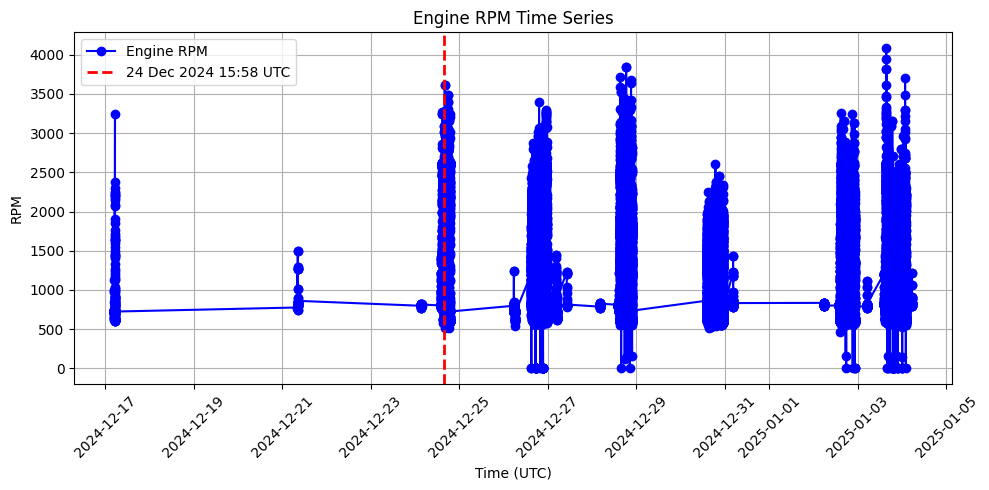

In [87]:
import matplotlib.pyplot as plt
from datetime import datetime, timezone
import pandas as pd



# Convert to timezone-aware datetime (UTC)
RPM_Time_dt = [datetime.fromtimestamp(ts / 1000.0, tz=timezone.utc) for ts in RPM_Time_vec]

# Create DataFrame
df = pd.DataFrame({'Time': RPM_Time_dt, 'RPM': RPM_Val_vec})

# Define highlight timestamp
highlight_timestamp = datetime(2024, 12, 24, 15, 58, 20, tzinfo=timezone.utc)

# Plot
plt.figure(figsize=(10, 5))
plt.plot(df['Time'], df['RPM'], marker='o', label='Engine RPM', color='blue')

# Add vertical line
plt.axvline(x=highlight_timestamp, color='red', linestyle='--', linewidth=2, label='24 Dec 2024 15:58 UTC')

# Formatting
plt.title('Engine RPM Time Series')
plt.xlabel('Time (UTC)')
plt.ylabel('RPM')
plt.grid(True)
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()

# Show plot
plt.show()


In [97]:
import plotly.graph_objects as go
from datetime import datetime, timezone
import pandas as pd



# Epoch to highlight (milliseconds)
highlight_epoch_ms = 1735036108000

# Convert timestamps to timezone-aware UTC datetime
RPM_Time_dt = [datetime.fromtimestamp(ts / 1000.0, tz=timezone.utc) for ts in RPM_Time_vec]
highlight_timestamp = datetime.fromtimestamp(highlight_epoch_ms / 1000.0, tz=timezone.utc)

# Create DataFrame
df = pd.DataFrame({'Time': RPM_Time_dt, 'RPM': RPM_Val_vec})

# Create figure
fig = go.Figure()

# Add time series line
fig.add_trace(go.Scatter(
    x=df['Time'],
    y=df['RPM'],
    mode='lines+markers',
    name='Engine RPM',
    line=dict(color='blue')
))

# Add vertical line (without annotation)
fig.add_vline(
    x=highlight_timestamp,
    line_width=2,
    line_dash='dash',
    line_color='red'
)

# Add custom annotation manually
fig.add_annotation(
    x=highlight_timestamp,
    y=1,  # Top of the plot (100% height)
    yref='paper',  # Relative to the plot area
    text='24 Dec 2024 15:58 UTC',
    showarrow=False,
    xanchor='left',
    font=dict(color='red')
)

# Layout
fig.update_layout(
    title='Engine RPM Time Series',
    xaxis_title='Time (UTC)',
    yaxis_title='RPM',
    template='plotly_white'
)

# Show plot
fig.show()


In [98]:
import plotly.graph_objects as go
from datetime import datetime, timezone
import pandas as pd

# Constants
PROTOCOL = 'ISO'
LABEL = 'WHEEL_SPEED'

# Extract data
WHEEL_SPEED_Time_vec, WHEEL_SPEED_Val_vec = extract_PID_data(data, PROTOCOL, LABEL)

# Highlight epoch in milliseconds (24 Dec 2024 15:58:28 UTC)
highlight_epoch_ms = 1735036108000
highlight_timestamp = datetime.fromtimestamp(highlight_epoch_ms / 1000.0, tz=timezone.utc)

# Convert timestamps to timezone-aware UTC datetime
WHEEL_SPEED_Time_dt = [
    datetime.fromtimestamp(ts / 1000.0, tz=timezone.utc)
    for ts in WHEEL_SPEED_Time_vec
]

# Create DataFrame
df = pd.DataFrame({
    'Time': WHEEL_SPEED_Time_dt,
    'Speed': WHEEL_SPEED_Val_vec
})

# Create Plotly figure
fig = go.Figure()

# Plot the wheel speed time series
fig.add_trace(go.Scatter(
    x=df['Time'],
    y=df['Speed'],
    mode='lines+markers',
    name='Wheel Speed',
    line=dict(color='blue')
))

# Add vertical line for highlight timestamp
fig.add_vline(
    x=highlight_timestamp,
    line_width=2,
    line_dash='dash',
    line_color='red'
)

# Add annotation at top of plot
fig.add_annotation(
    x=highlight_timestamp,
    y=1,
    yref='paper',
    text='24 Dec 2024 15:58 UTC',
    showarrow=False,
    xanchor='left',
    font=dict(color='red')
)

# Final layout
fig.update_layout(
    title='Wheel Speed Time Series',
    xaxis_title='Time (UTC)',
    yaxis_title='Speed',
    template='plotly_white'
)

# Show the plot
fig.show()
